In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast  # For safely evaluating string literals (like lists)
import warnings

In [43]:
# Suppress future warnings for cleaner output
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning, module='seaborn')

# Plotting style
sns.set_style('white')
plt.rcParams['figure.figsize'] = (10, 6)


In [44]:
def parse_string_to_list_robust(s):
    """Safely parses a string representation of a list/array, handling various formats."""
    if not isinstance(s, str):
        return []
    s_cleaned = s.strip()
    try:
        if s_cleaned.startswith('[') and s_cleaned.endswith(']'):
            s_content = s_cleaned[1:-1].strip()
            s_content_normalized = ' '.join(s_content.split())
            items_str = s_content_normalized.split()
            
            processed_items = []
            for item_str in items_str:
                try:
                    # Try converting to float first
                    val = float(item_str)
                    # If it's an integer, convert to int
                    if val.is_integer():
                        processed_items.append(int(val))
                    else:
                        processed_items.append(val)
                except ValueError:
                    # If float conversion fails, keep as string (should not happen for X_ml_unscale based on sample)
                    processed_items.append(item_str)
            return processed_items
        else: # For simple strings that might be single numbers or non-list representations
            try:
                return ast.literal_eval(s_cleaned)
            except (ValueError, SyntaxError):
                return [s_cleaned] # Treat as a list with one item if not evaluatable
    except Exception as e:
        print(f"Robust parsing failed for string '{s[:100]}...': {e}. Returning empty list.")
        return []


In [45]:
def reconstruct_flat_dataframe(raw_df):
    """
    Reconstructs a flat DataFrame from the FinBench cf2 format.
    Uses 'col_name' for headers, 'cat_idx' to identify categorical features,
    and 'X_ml_unscale' for feature values.
    """
    if raw_df.empty:
        print("Warning: Input DataFrame for reconstruction is empty.")
        return pd.DataFrame(), [], [], []

    # Parse metadata from the first row
    try:
        all_feature_names_source = parse_string_to_list_robust(raw_df['col_name'].iloc[0])
        cat_indices_source = [int(i) for i in parse_string_to_list_robust(raw_df['cat_idx'].iloc[0])]
    except Exception as e:
        print(f"Error parsing metadata columns (col_name, cat_idx) from the first row: {e}")
        return pd.DataFrame(), [], [], []

    if not isinstance(all_feature_names_source, list) or not all(isinstance(name, str) for name in all_feature_names_source):
        print(f"Error: Parsed 'col_name' is not a list of strings: {all_feature_names_source}")
        return pd.DataFrame(), [], [], []
    
    # Handle duplicate column names from source by using the last occurrence (inherent in dict(zip(...)))
    # However, it's better to alert and then de-duplicate for ColumnTransformer lists.
    if len(all_feature_names_source) != len(set(all_feature_names_source)):
        print("Warning: Duplicate names found in source 'col_name'. The reconstructed DataFrame will use unique names based on last occurrence.")
        # For the DataFrame columns, dict(zip()) effectively de-duplicates by taking the last one.
        # For our lists for ColumnTransformer, we'll de-duplicate while preserving order.
    
    # These are the unique column names that the reconstructed DataFrame will have
    unique_col_names_for_df = list(dict.fromkeys(all_feature_names_source))


    reconstructed_data_rows = []
    for index, row in raw_df.iterrows():
        try:
            x_unscale_values = parse_string_to_list_robust(row['X_ml_unscale'])
            
            if len(x_unscale_values) != len(all_feature_names_source):
                print(f"Row {index}: Mismatch in length of X_ml_unscale ({len(x_unscale_values)}) and source col_name ({len(all_feature_names_source)}). Skipping row.")
                continue
            
            # Create a dictionary using original source names (duplicates will be overwritten by last one)
            current_row_dict_source_names = dict(zip(all_feature_names_source, x_unscale_values))
            
            # Rebuild the row using unique column names to match the final DataFrame structure
            current_row_data = {name: current_row_dict_source_names[name] for name in unique_col_names_for_df}
            current_row_data[TARGET_COLUMN] = row[TARGET_COLUMN]
            reconstructed_data_rows.append(current_row_data)
        except Exception as e:
            print(f"Error processing row {index}: {e}. Skipping row.")
            continue
            
    flat_df = pd.DataFrame(reconstructed_data_rows)

    # Determine unique numerical and categorical feature names based on unique_col_names_for_df
    # and original cat_indices_source applied to all_feature_names_source
    
    _temp_categorical_feature_names = []
    for idx in cat_indices_source:
        if idx < len(all_feature_names_source):
            _temp_categorical_feature_names.append(all_feature_names_source[idx])
    
    # De-duplicate while preserving order for the lists used by ColumnTransformer later
    categorical_feature_names = list(dict.fromkeys(_temp_categorical_feature_names))
    
    numerical_feature_names = []
    for name in unique_col_names_for_df: # Iterate through unique names in the final DataFrame
        if name not in categorical_feature_names:
            numerical_feature_names.append(name)
            
    # Explicitly set dtype for categorical columns in the flat_df
    for col_name in categorical_feature_names:
        if col_name in flat_df.columns:
            # Convert to string first, then category, to handle numerical representations of categories
            flat_df[col_name] = flat_df[col_name].astype(str)
            # It's often better to convert to 'category' dtype for EDA if memory allows
            # and for some plotting functions, but string is fine for initial processing.
            # For actual preprocessing, this would be handled by the encoder.
            # For EDA, let's try converting to 'category' for better seaborn behavior.
            try:
                flat_df[col_name] = flat_df[col_name].astype('category')
            except Exception as e:
                print(f"Could not convert column {col_name} to 'category' dtype: {e}")


    return flat_df, numerical_feature_names, categorical_feature_names, unique_col_names_for_df


In [46]:
TARGET_COLUMN = 'y'
path = "../data/raw/FinBench/finbench_csv_data/yuweiyin_FinBench_cf2_train.csv"
raw_df = pd.read_csv(path)

if raw_df.empty:
    print("Loaded DataFrame is empty. Exiting.")
    

print("Reconstructing DataFrame from FinBench format...")
flat_df, numerical_features, categorical_features, all_original_feature_names = reconstruct_flat_dataframe(raw_df)

if flat_df.empty:
    print("DataFrame reconstruction failed or resulted in an empty DataFrame. Exiting EDA.")
    
df = flat_df
print(f"\nReconstructed DataFrame shape: {flat_df.shape}")
print(f"Identified {len(numerical_features)} numerical features.")
print(f"Identified {len(categorical_features)} categorical features.")

Reconstructing DataFrame from FinBench format...

Reconstructed DataFrame shape: (5418, 119)
Identified 102 numerical features.
Identified 16 categorical features.


In [47]:
if df.empty:
    print("DataFrame is empty. Skipping EDA.")
print("\n--- 2. Basic Data Overview ---")
print("DataFrame Shape:", df.shape)
print("\nData Types:\n", df.dtypes)
print("\nFirst 5 Rows:")
print(df.head())
print("\nDescriptive Statistics (Numerical Features):")
if numerical_features:
    print(df[numerical_features].describe().T)
else:
    print("No numerical features identified for description.")


--- 2. Basic Data Overview ---
DataFrame Shape: (5418, 119)

Data Types:
 'contract_type'                    category
'gender'                           category
'own_car'                          category
'own_reality'                      category
'number_of_children'                  int64
                                     ...   
'weeks_of_REQ_CREDIT_BUREAU'          int64
'months_of_REQ_CREDIT_BUREAU'         int64
'quarters_of_REQ_CREDIT_BUREAU'       int64
'years_of_REQ_CREDIT_BUREAU'          int64
y                                     int64
Length: 119, dtype: object

First 5 Rows:
  'contract_type' 'gender' 'own_car' 'own_reality'  'number_of_children'  \
0               0        1         0             1                     1   
1               0        0         0             0                     0   
2               0        1         0             1                     2   
3               0        1         0             1                     0   
4               0  

In [48]:
print("\nDuplicate Rows Check:")
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")
if num_duplicates > 0:
    print("Recommendation: Investigate and handle duplicate rows if they are not expected.")


Duplicate Rows Check:
Number of duplicate rows: 0


In [49]:
print("\n--- 3. Missing Value Analysis ---")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
missing_info = pd.DataFrame({'Missing Count': missing_values, 'Percentage (%)': missing_percentage})
missing_info = missing_info[missing_info['Missing Count'] > 0].sort_values(by='Percentage (%)', ascending=False)

if not missing_info.empty:
    print("Features with missing values:")
    print(missing_info)
    plt.figure(figsize=(15, max(8, len(missing_info) * 0.5))) # Adjust height based on num missing
    sns.barplot(x=missing_info.index, y='Percentage (%)', data=missing_info, palette='viridis')
    plt.xticks(rotation=90)
    plt.title('Percentage of Missing Values by Feature')
    plt.ylabel('Percentage (%)')
    plt.tight_layout()
    plt.show()
    print("Recommendation: Impute missing values. Strategies depend on the feature type and percentage missing (e.g., median/mean for numerical, mode for categorical).")
else:
    print("No missing values found in the reconstructed DataFrame!")


--- 3. Missing Value Analysis ---
No missing values found in the reconstructed DataFrame!



--- 3. Analiza Zmiennej Celu: 'y' ---
Zmienna celu: 'y'
Klasy: 0 - transakcja legalna, 1 - oszustwo

Rozkład klas:
Liczebność klas:
y
0    5092
1     326
Name: count, dtype: int64

Procentowy udział klas:
y
0    93.98302
1     6.01698
Name: proportion, dtype: float64


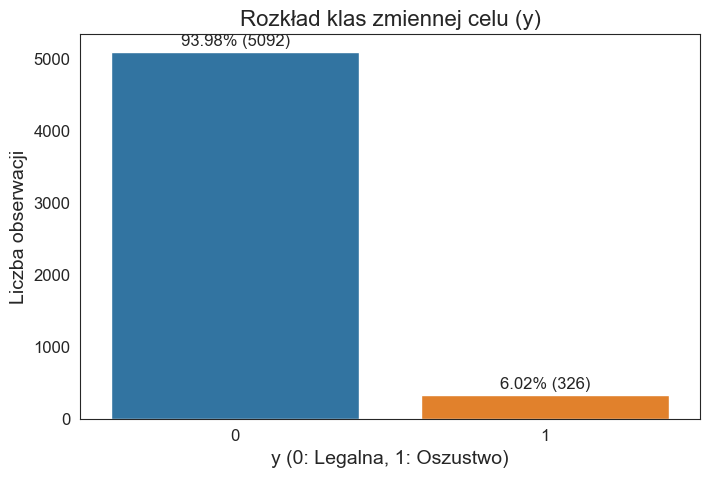


Problem jest niezbalansowany. Klasa mniejszościowa stanowi znacznie mniejszy odsetek.
Implikacje: Należy rozważyć techniki radzenia sobie z niezbalansowanymi danymi, takie jak oversampling, undersampling, SMOTE, lub użycie odpowiednich metryk oceny (np. F1-score, AUC-PR).


In [50]:
# 3. Analiza Zmiennej Celu (Target Variable: fraud_bool)
print(f"\n--- 3. Analiza Zmiennej Celu: '{TARGET_COLUMN}' ---")
if TARGET_COLUMN not in df.columns:
    print(f"BŁĄD: Zmienna celu '{TARGET_COLUMN}' nie została znaleziona w danych.")
else:
    print(f"Zmienna celu: '{TARGET_COLUMN}'")
    print("Klasy: 0 - transakcja legalna, 1 - oszustwo")

    class_counts = df[TARGET_COLUMN].value_counts()
    class_percentages = df[TARGET_COLUMN].value_counts(normalize=True) * 100

    print("\nRozkład klas:")
    print("Liczebność klas:")
    print(class_counts)
    print("\nProcentowy udział klas:")
    print(class_percentages)

    plt.figure(figsize=(8, 5))
    sns.countplot(x=TARGET_COLUMN, data=df, hue=TARGET_COLUMN, legend=False)
    plt.title(f'Rozkład klas zmiennej celu ({TARGET_COLUMN})')
    plt.xlabel(f'{TARGET_COLUMN} (0: Legalna, 1: Oszustwo)')
    plt.ylabel('Liczba obserwacji')
    # Dodanie adnotacji procentowych
    for i, count in enumerate(class_counts):
        percentage = class_percentages.iloc[i]
        plt.text(i, count + (0.01 * df.shape[0]), f'{percentage:.2f}% ({count})', ha='center', va='bottom')
    plt.show()

    if abs(class_percentages.get(0, 0) - class_percentages.get(1, 0)) > 30:  # Próg np. 65/35
        print("\nProblem jest niezbalansowany. Klasa mniejszościowa stanowi znacznie mniejszy odsetek.")
        print(
            "Implikacje: Należy rozważyć techniki radzenia sobie z niezbalansowanymi danymi, takie jak oversampling, undersampling, SMOTE, lub użycie odpowiednich metryk oceny (np. F1-score, AUC-PR).")
    else:
        print("\nProblem wydaje się być stosunkowo zbalansowany lub lekko niezbalansowany.")

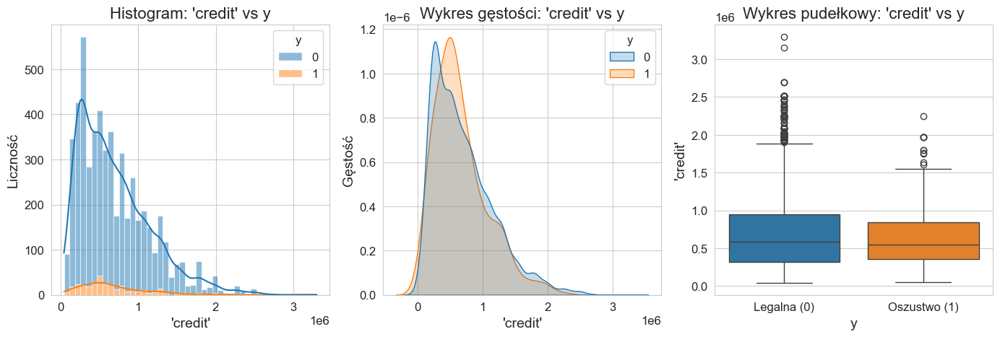

In [61]:

plt.figure(figsize=(14, 5))
col = "'credit'"
# Histogramy
plt.subplot(1, 3, 1)
sns.histplot(data=df, x=col, hue=TARGET_COLUMN, kde=True, multiple="stack")
plt.title(f'Histogram: {col} vs {TARGET_COLUMN}')
plt.ylabel("Liczność")

# Wykresy gęstości
plt.subplot(1, 3, 2)
sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)
plt.title(f'Wykres gęstości: {col} vs {TARGET_COLUMN}')
plt.ylabel("Gęstość")

# Box-ploty
plt.subplot(1, 3, 3)
sns.boxplot(data=df, x=TARGET_COLUMN, y=col, hue=TARGET_COLUMN, legend=False)
plt.title(f'Wykres pudełkowy: {col} vs {TARGET_COLUMN}')
plt.xticks([0, 1], ['Legalna (0)', 'Oszustwo (1)'])

plt.tight_layout()
plt.show()


--- 4. Analiza Poszczególnych Cech w Kontekście Zmiennej Celu ('y') ---

Analiza cech numerycznych:

Cecha numeryczna: 'number_of_children'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.610173  0.783245  0.0  0.0  0.0  1.0  5.0
1   326.0  0.533742  0.725638  0.0  0.0  0.0  1.0  3.0


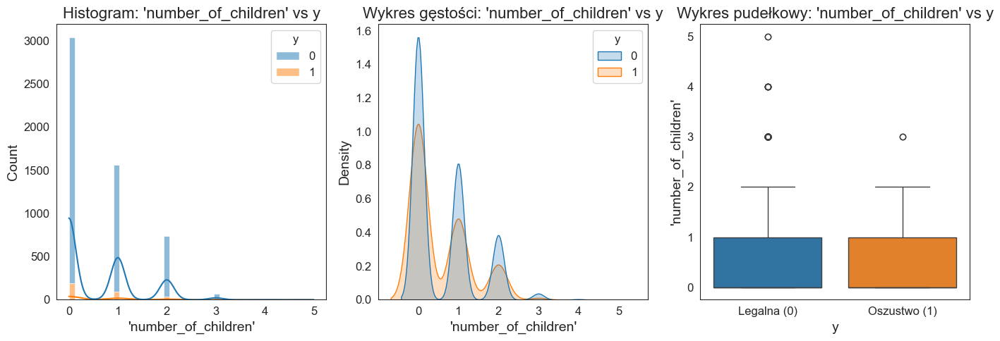

--------------------------------------------------

Cecha numeryczna: 'income'
Statystyki opisowe:
    count           mean            std      min       25%       50%  \
y                                                                      
0  5092.0  223700.218480  148271.340918  33750.0  135000.0  193500.0   
1   326.0  198845.875767  108048.099072  59850.0  135000.0  180000.0   

        75%        max  
y                       
0  270000.0  4500000.0  
1  225000.0  1170000.0  


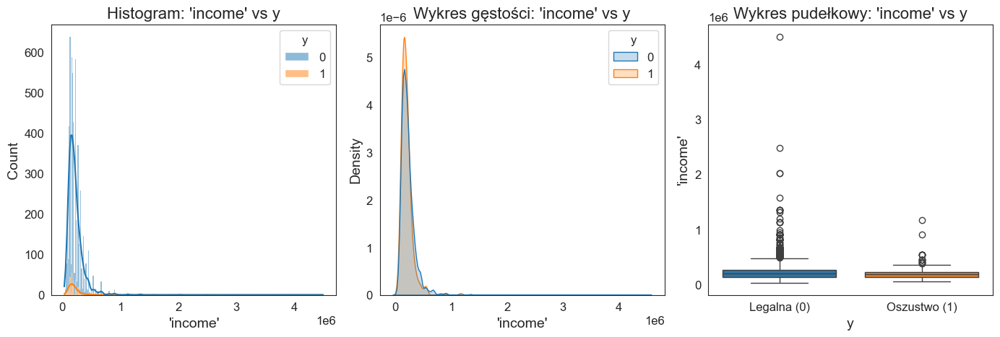

--------------------------------------------------

Cecha numeryczna: 'credit'
Statystyki opisowe:
    count           mean            std      min        25%        50%  \
y                                                                        
0  5092.0  699661.550079  468363.653736  45000.0  314088.75  585816.75   
1   326.0  664163.268405  410054.713925  50940.0  360000.00  545040.00   

          75%        max  
y                         
0  948623.625  3299688.0  
1  846807.750  2250000.0  


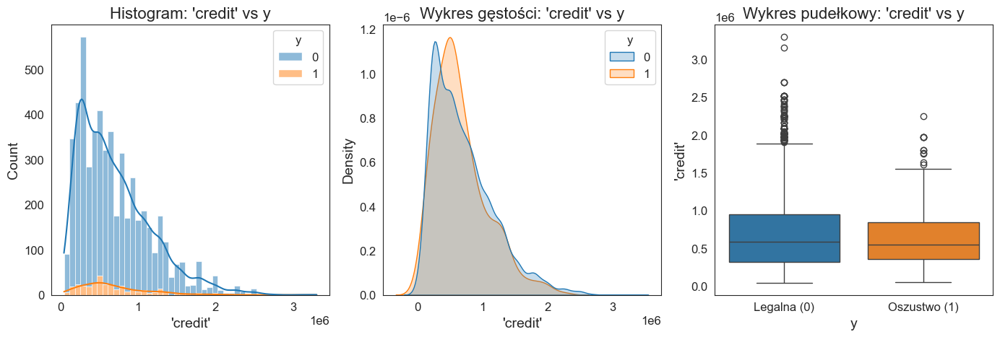

--------------------------------------------------

Cecha numeryczna: 'annuity'
Statystyki opisowe:
    count          mean           std     min       25%       50%        75%  \
y                                                                              
0  5092.0  31529.664474  16879.642093  2317.5  19325.25  28935.00  40320.000   
1   326.0  30916.573620  13951.796745  5535.0  20913.75  30057.75  38737.125   

        max  
y            
0  213291.0  
1   71649.0  


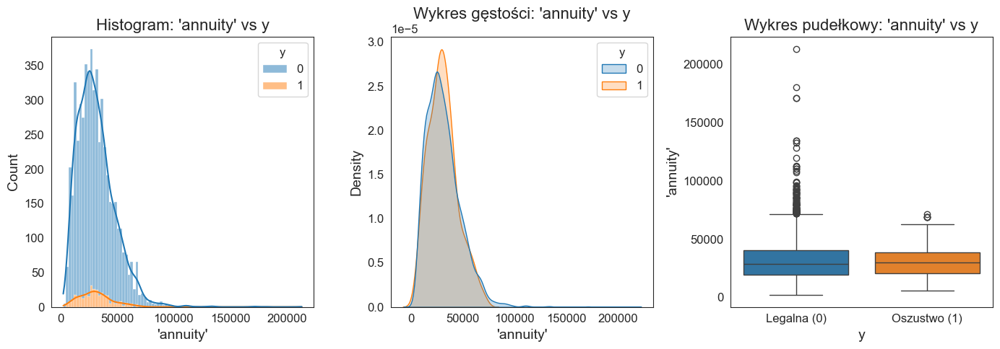

--------------------------------------------------

Cecha numeryczna: 'goods_price'
Statystyki opisowe:
    count           mean            std      min       25%       50%  \
y                                                                      
0  5092.0  634588.734485  433591.927768  45000.0  270000.0  495000.0   
1   326.0  589988.636503  379004.108558  45000.0  315000.0  454500.0   

        75%        max  
y                       
0  900000.0  3150000.0  
1  695250.0  2250000.0  


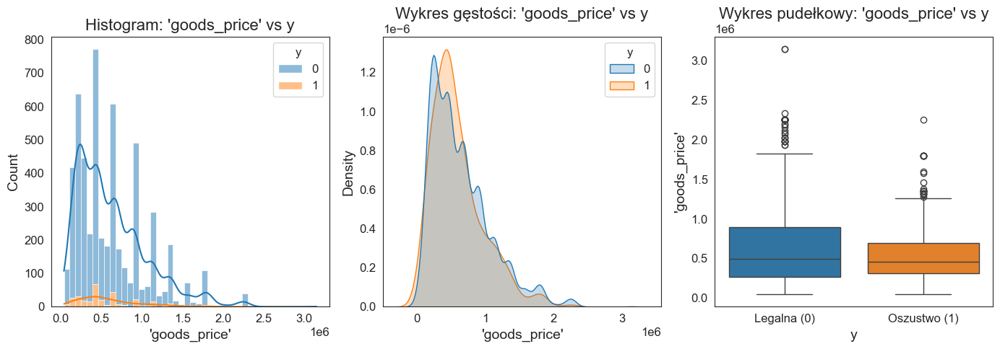

--------------------------------------------------

Cecha numeryczna: 'region_population_relative'
Statystyki opisowe:
    count      mean       std       min       25%       50%       75%  \
y                                                                       
0  5092.0  0.023622  0.016435  0.000290  0.010556  0.020246  0.030755   
1   326.0  0.022351  0.013880  0.001276  0.011657  0.020246  0.028663   

        max  
y            
0  0.072508  
1  0.072508  


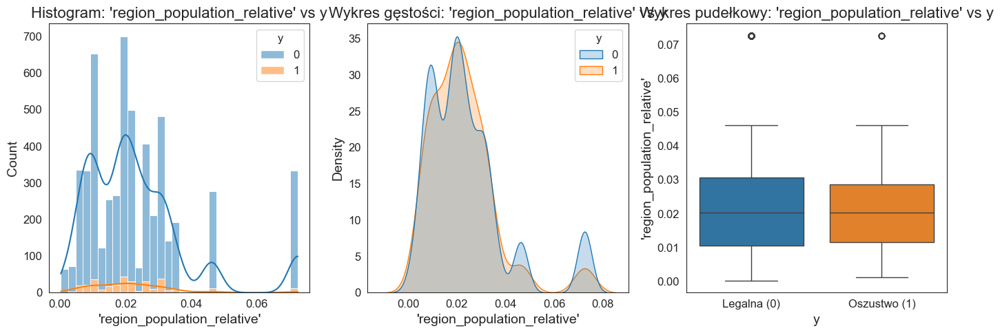

--------------------------------------------------

Cecha numeryczna: 'days_after_birth'
Statystyki opisowe:
    count          mean          std      min      25%      50%       75%  \
y                                                                           
0  5092.0 -14210.757659  3258.671710 -24835.0 -16386.5 -13906.0 -11679.75   
1   326.0 -13667.122699  3252.132519 -22359.0 -15813.0 -13345.5 -11119.25   

      max  
y          
0 -7718.0  
1 -7962.0  


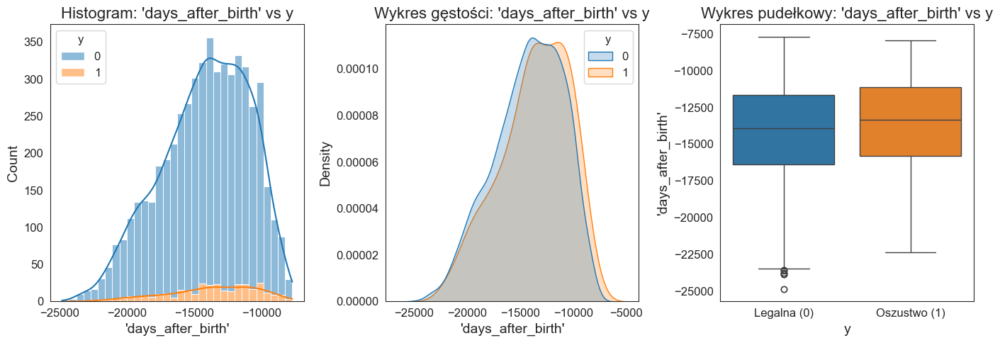

--------------------------------------------------

Cecha numeryczna: 'days_of_employment'
Statystyki opisowe:
    count         mean          std      min      25%     50%    75%    max
y                                                                          
0  5092.0 -2348.381579  2121.725167 -14375.0 -3197.25 -1718.0 -833.5  -27.0
1   326.0 -1680.285276  1670.019018 -11710.0 -2056.75 -1204.0 -588.5 -102.0


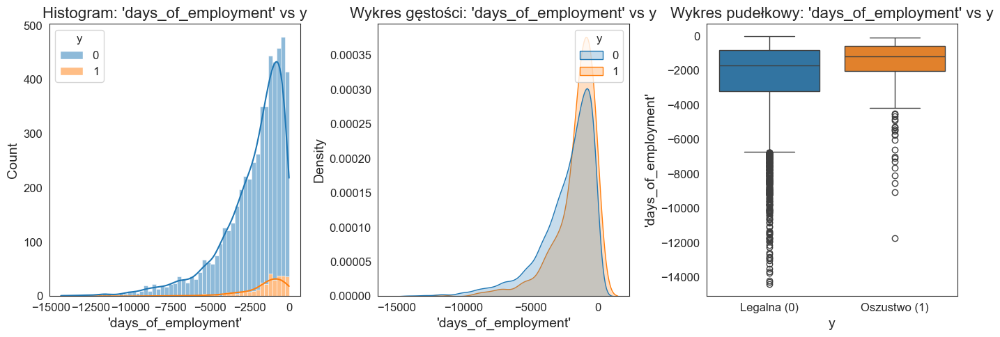

--------------------------------------------------

Cecha numeryczna: 'days_of_registration'
Statystyki opisowe:
    count         mean          std      min      25%     50%      75%  max
y                                                                          
0  5092.0 -4292.687156  3078.348606 -16906.0 -6588.50 -4057.5 -1473.75 -2.0
1   326.0 -4225.696319  3198.535421 -15818.0 -6503.75 -3932.0 -1128.00 -8.0


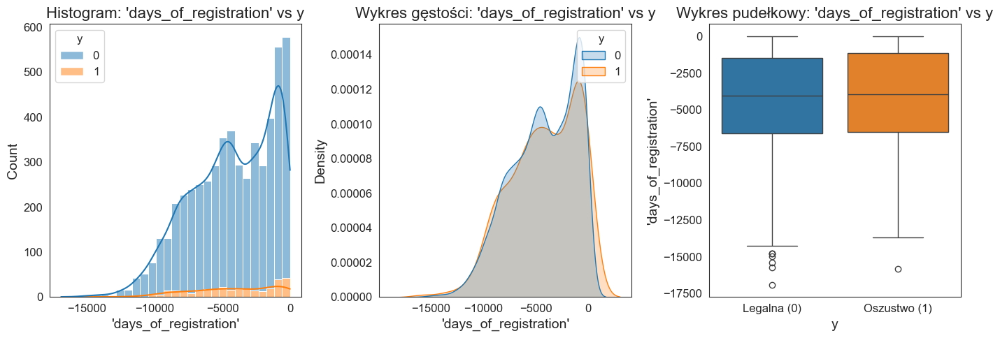

--------------------------------------------------

Cecha numeryczna: 'days_of_ID_publish'
Statystyki opisowe:
    count         mean          std     min      25%     50%     75%    max
y                                                                          
0  5092.0 -2976.213472  1507.196830 -6551.0 -4276.25 -3196.0 -1726.5   -3.0
1   326.0 -2836.414110  1529.045578 -5986.0 -4215.75 -2933.5 -1449.5 -111.0


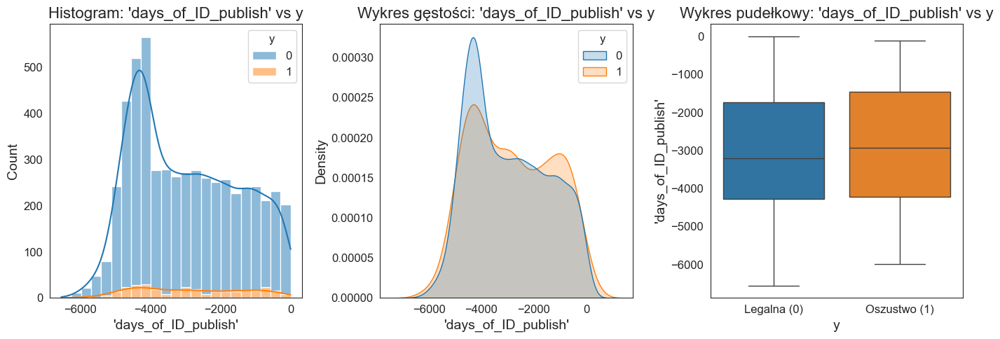

--------------------------------------------------

Cecha numeryczna: 'years_of_car_ownership'
Statystyki opisowe:
    count       mean        std  min  25%   50%   75%   max
y                                                          
0  5092.0  11.075609  12.303660  0.0  4.0   8.0  14.0  65.0
1   326.0  12.776074  13.374448  0.0  6.0  10.0  15.0  65.0


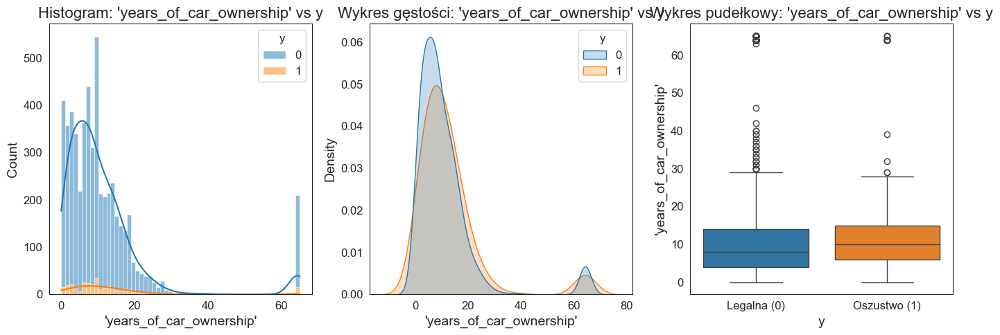

--------------------------------------------------

Cecha numeryczna: 'mobile_phone'
Statystyki opisowe:
    count  mean  std  min  25%  50%  75%  max
y                                            
0  5092.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
1   326.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0

Cecha numeryczna: 'cell_phone'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.999804  0.014014  0.0  1.0  1.0  1.0  1.0
1   326.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


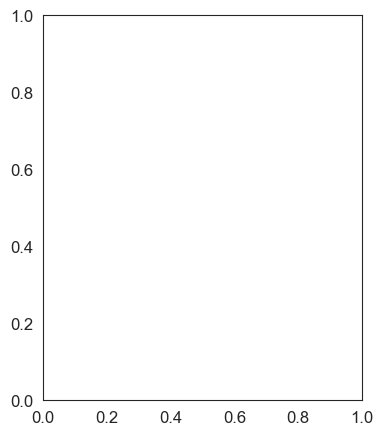

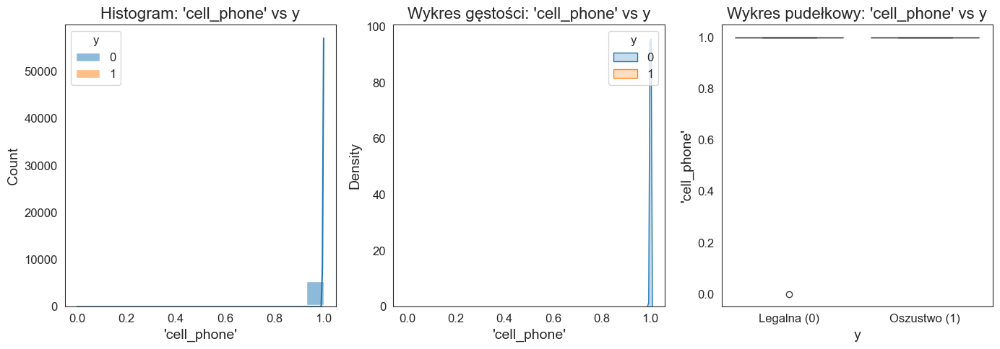

--------------------------------------------------

Cecha numeryczna: 'work_phone'
Statystyki opisowe:
    count      mean      std  min  25%  50%  75%  max
y                                                    
0  5092.0  0.211115  0.40814  0.0  0.0  0.0  0.0  1.0
1   326.0  0.239264  0.42729  0.0  0.0  0.0  0.0  1.0


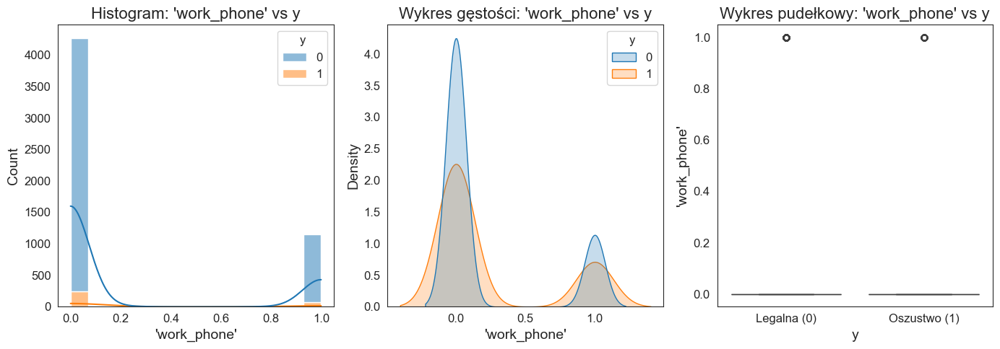

--------------------------------------------------

Cecha numeryczna: 'mobile'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.996465  0.059356  0.0  1.0  1.0  1.0  1.0
1   326.0  0.996933  0.055385  0.0  1.0  1.0  1.0  1.0


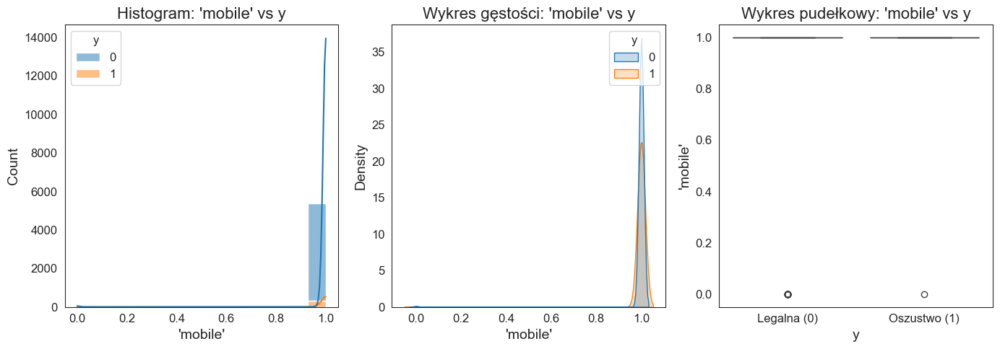

--------------------------------------------------

Cecha numeryczna: 'phone'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.315004  0.464563  0.0  0.0  0.0  1.0  1.0
1   326.0  0.309816  0.463128  0.0  0.0  0.0  1.0  1.0


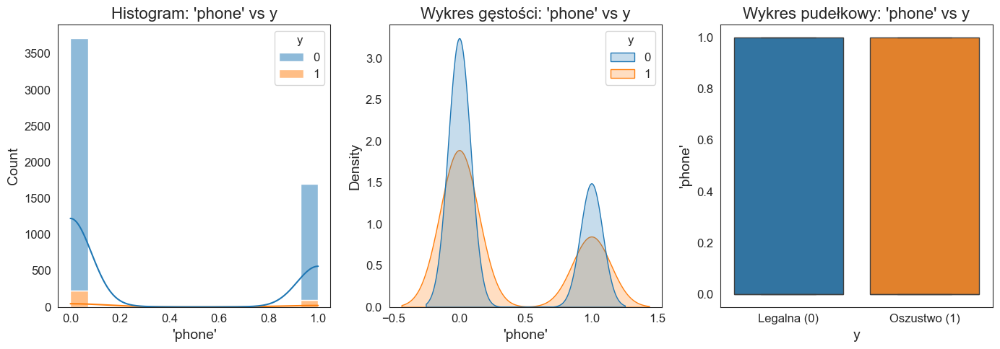

--------------------------------------------------

Cecha numeryczna: 'email'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.122545  0.327947  0.0  0.0  0.0  0.0  1.0
1   326.0  0.131902  0.338904  0.0  0.0  0.0  0.0  1.0


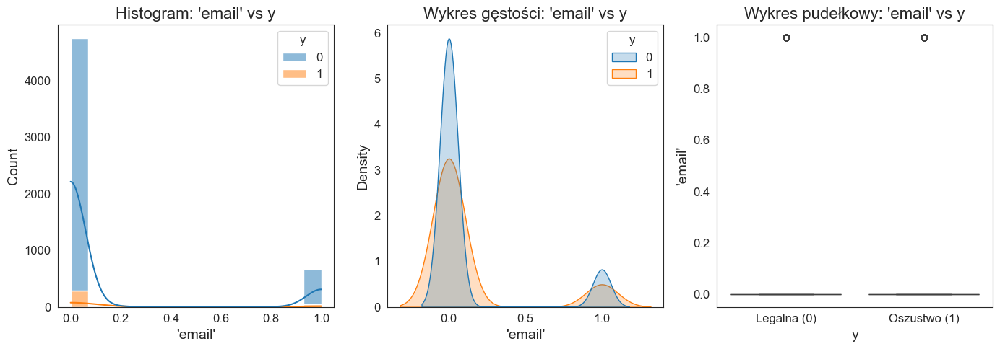

--------------------------------------------------

Cecha numeryczna: 'number_of_family_members'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  2.410448  0.946015  1.0  2.0  2.0  3.0  7.0
1   326.0  2.319018  0.899268  1.0  2.0  2.0  3.0  5.0


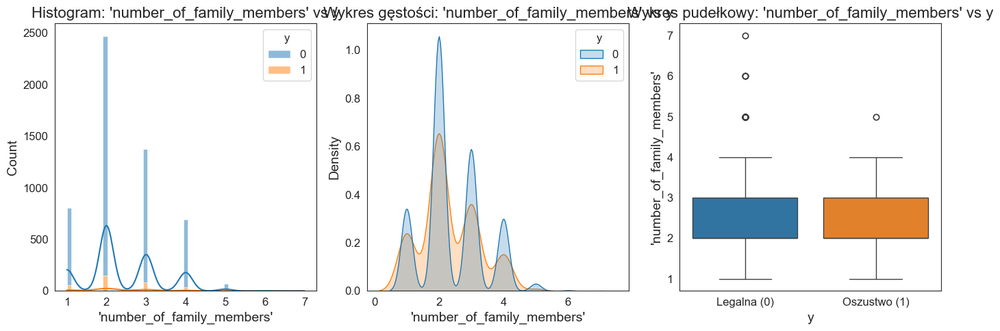

--------------------------------------------------

Cecha numeryczna: 'region_rating_client'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  2.004910  0.560410  1.0  2.0  2.0  2.0  3.0
1   326.0  2.092025  0.552586  1.0  2.0  2.0  2.0  3.0


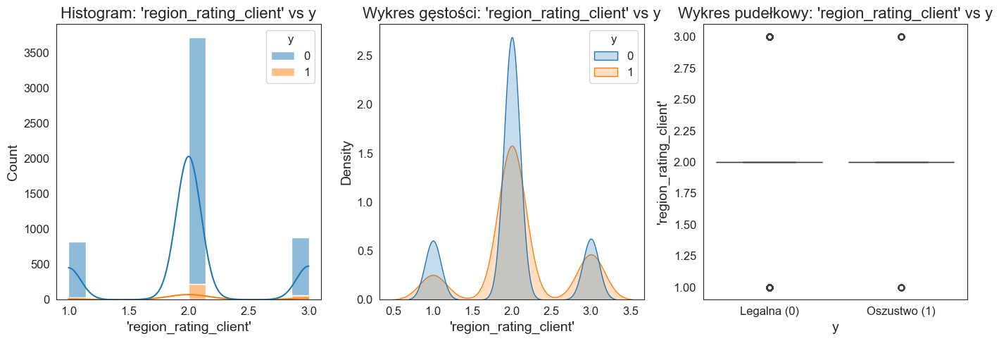

--------------------------------------------------

Cecha numeryczna: 'region_rating_client_with_city'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  1.949332  0.546579  1.0  2.0  2.0  2.0  3.0
1   326.0  2.046012  0.532945  1.0  2.0  2.0  2.0  3.0


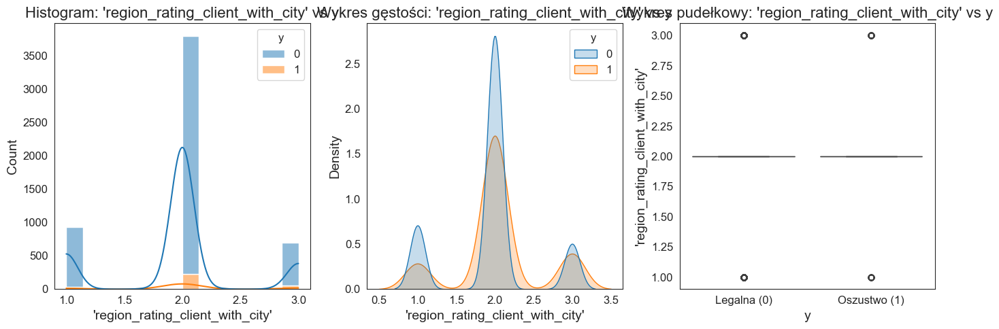

--------------------------------------------------

Cecha numeryczna: 'hour_APPR_process_start'
Statystyki opisowe:
    count       mean       std  min   25%   50%   75%   max
y                                                          
0  5092.0  12.203064  3.386746  1.0  10.0  12.0  15.0  23.0
1   326.0  12.134969  3.145723  3.0  10.0  12.0  14.0  21.0


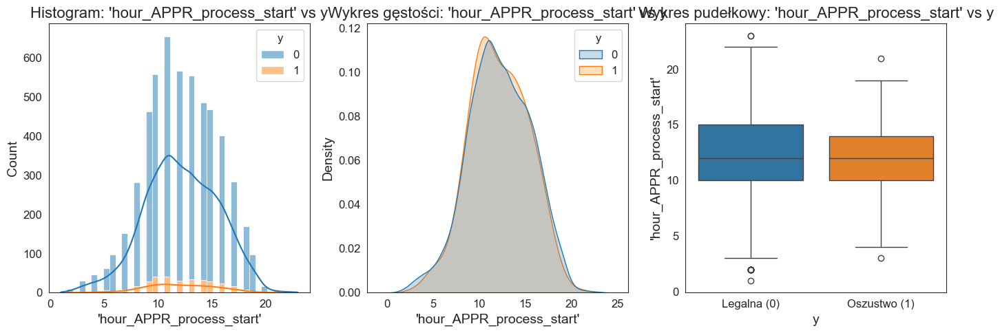

--------------------------------------------------

Cecha numeryczna: 'registered_region/not_live_region'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.014533  0.119684  0.0  0.0  0.0  0.0  1.0
1   326.0  0.012270  0.110257  0.0  0.0  0.0  0.0  1.0


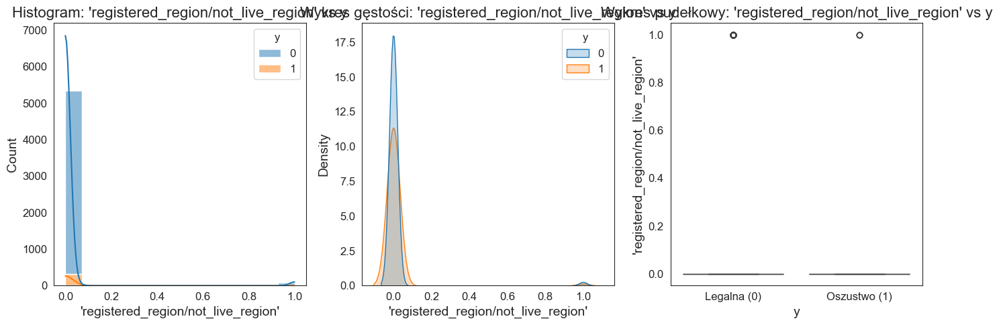

--------------------------------------------------

Cecha numeryczna: 'registered_region/not_work_region'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.060487  0.238410  0.0  0.0  0.0  0.0  1.0
1   326.0  0.064417  0.245872  0.0  0.0  0.0  0.0  1.0


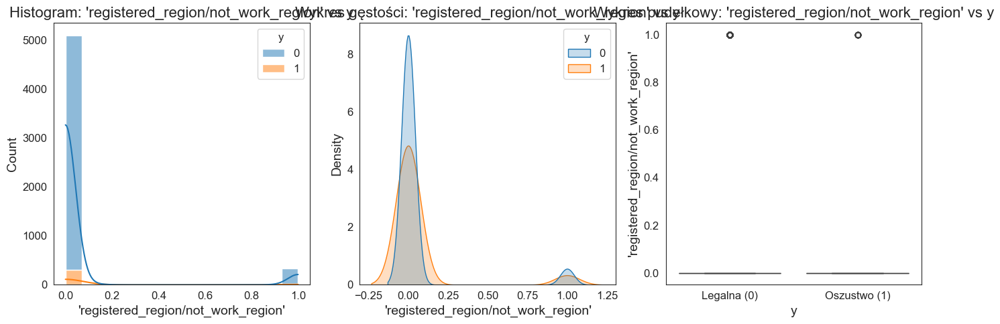

--------------------------------------------------

Cecha numeryczna: 'live_region/not_work_region'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.051060  0.220143  0.0  0.0  0.0  0.0  1.0
1   326.0  0.058282  0.234636  0.0  0.0  0.0  0.0  1.0


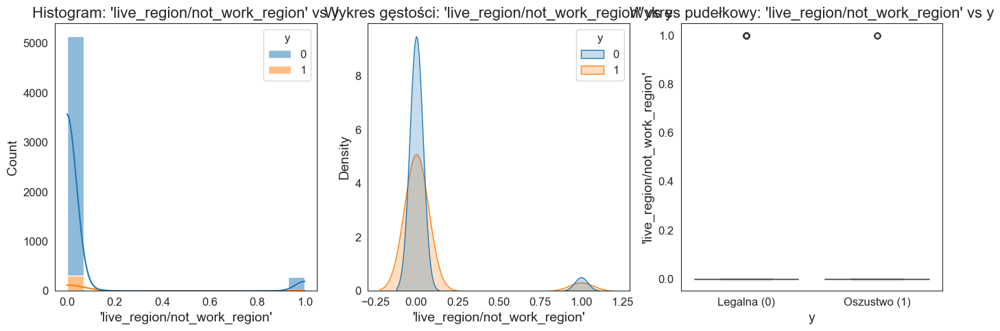

--------------------------------------------------

Cecha numeryczna: 'registered_city/not_live_city'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.038492  0.192399  0.0  0.0  0.0  0.0  1.0
1   326.0  0.046012  0.209834  0.0  0.0  0.0  0.0  1.0


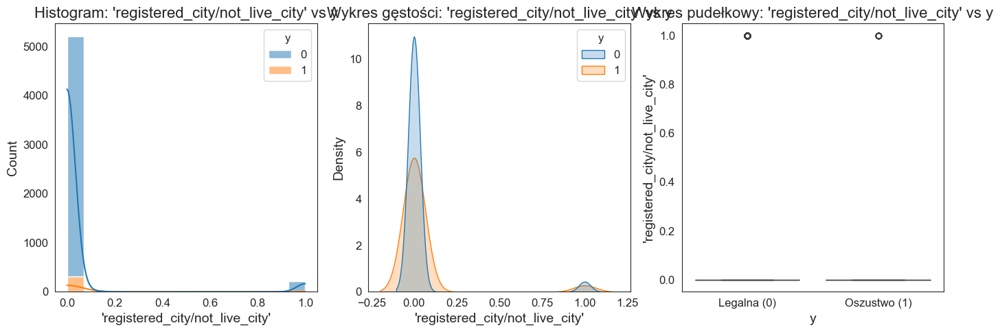

--------------------------------------------------

Cecha numeryczna: 'registered_city/not_work_city'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.147486  0.354625  0.0  0.0  0.0  0.0  1.0
1   326.0  0.174847  0.380420  0.0  0.0  0.0  0.0  1.0


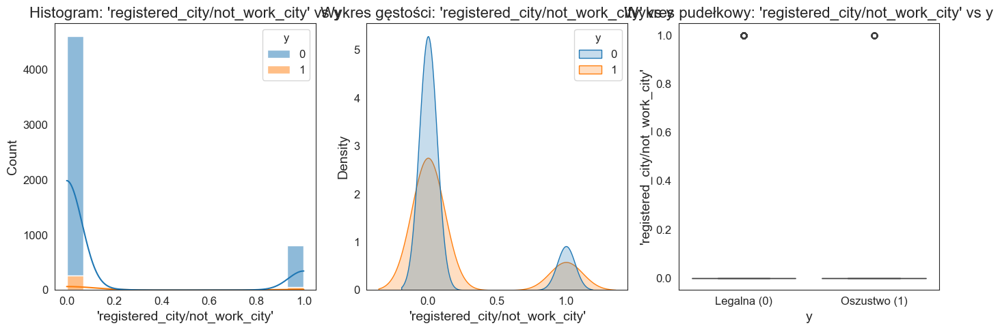

--------------------------------------------------

Cecha numeryczna: 'live_city/not_work_city'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.131186  0.337637  0.0  0.0  0.0  0.0  1.0
1   326.0  0.134969  0.342216  0.0  0.0  0.0  0.0  1.0


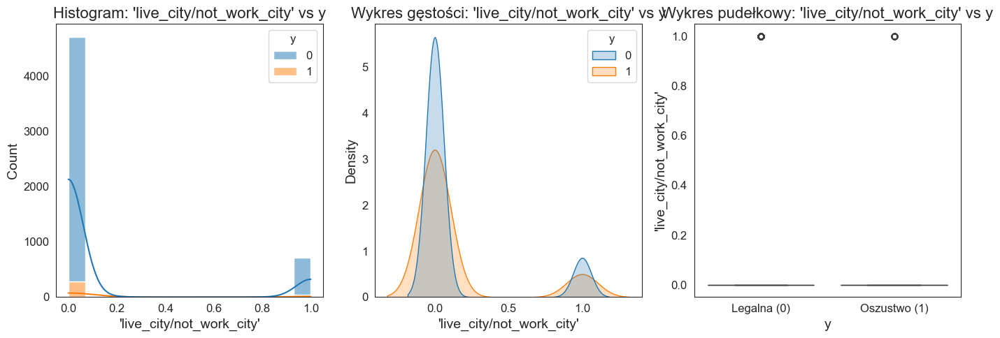

--------------------------------------------------

Cecha numeryczna: 'extension_source_1'
Statystyki opisowe:
    count      mean       std       min       25%       50%       75%  \
y                                                                       
0  5092.0  0.502443  0.203153  0.025348  0.342164  0.505112  0.665444   
1   326.0  0.393611  0.203317  0.020939  0.237043  0.364857  0.560676   

        max  
y            
0  0.941080  
1  0.875111  


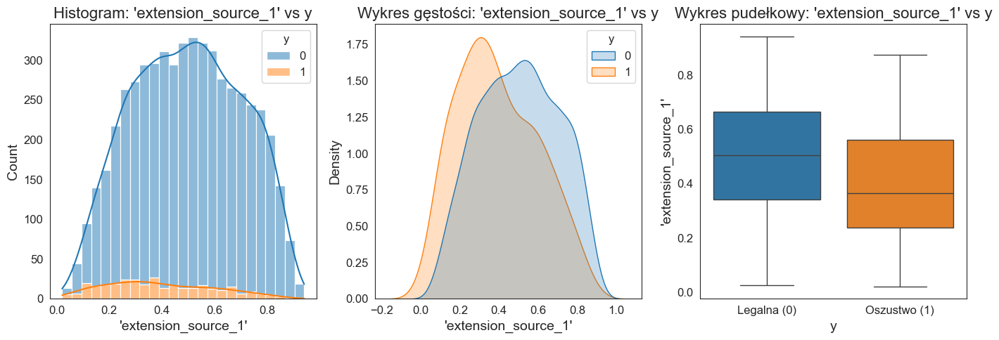

--------------------------------------------------

Cecha numeryczna: 'extension_source_2'
Statystyki opisowe:
    count      mean       std       min       25%       50%       75%  \
y                                                                       
0  5092.0  0.557678  0.169464  0.000961  0.471941  0.601639  0.685219   
1   326.0  0.459107  0.209879  0.000405  0.269033  0.506802  0.646856   

        max  
y            
0  0.811010  
1  0.789102  


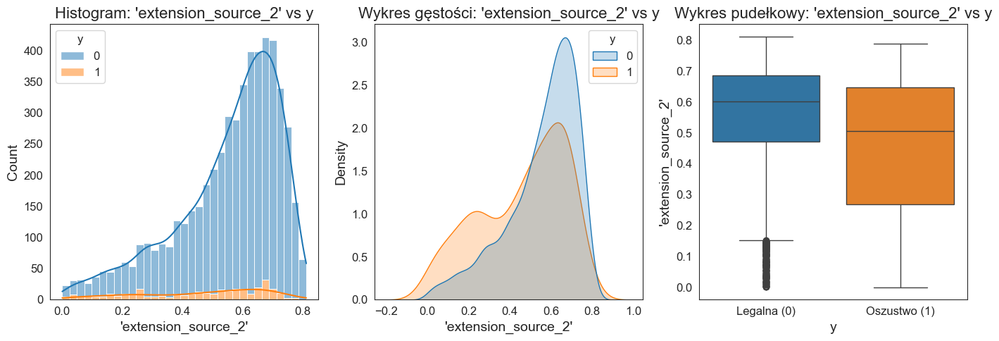

--------------------------------------------------

Cecha numeryczna: 'extension_source_3'
Statystyki opisowe:
    count      mean       std       min       25%       50%       75%  \
y                                                                       
0  5092.0  0.505366  0.190022  0.000527  0.368969  0.522697  0.659405   
1   326.0  0.390633  0.201761  0.000527  0.231439  0.370650  0.546023   

        max  
y            
0  0.878740  
1  0.834784  


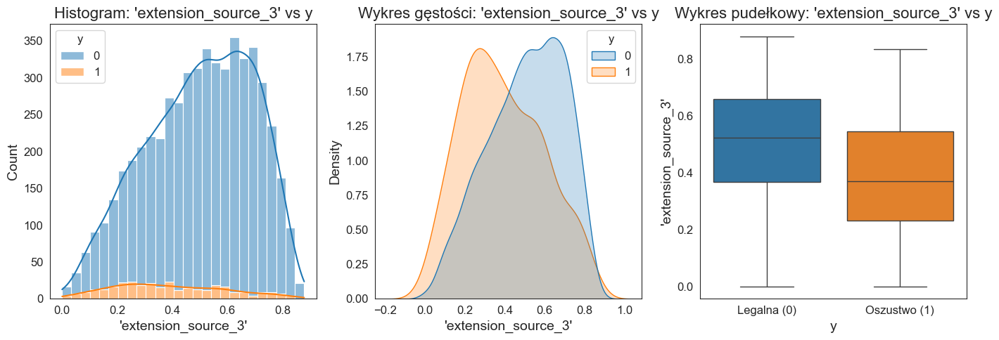

--------------------------------------------------

Cecha numeryczna: 'average_of_apartment'
Statystyki opisowe:
    count      mean       std     min     25%     50%       75%     max
y                                                                      
0  5092.0  0.131185  0.116057  0.0000  0.0629  0.0948  0.157700  1.0000
1   326.0  0.114760  0.092834  0.0021  0.0619  0.0918  0.142925  0.4959


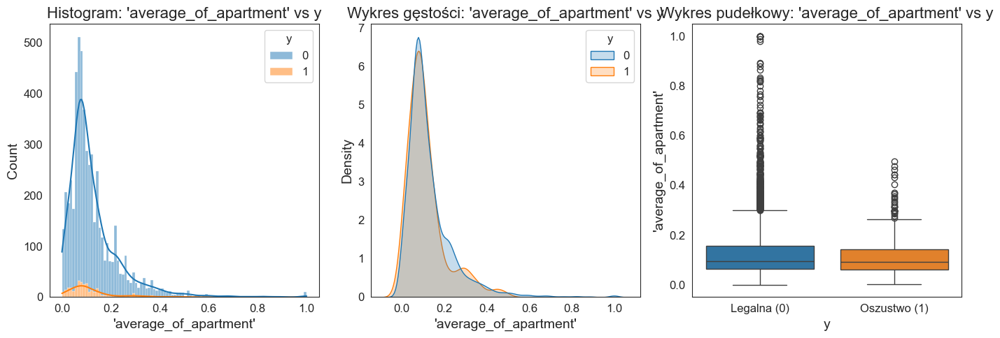

--------------------------------------------------

Cecha numeryczna: 'average_of_basement_area'
Statystyki opisowe:
    count      mean       std  min     25%     50%     75%     max
y                                                                 
0  5092.0  0.092817  0.080233  0.0  0.0487  0.0790  0.1155  1.0000
1   326.0  0.085834  0.070431  0.0  0.0395  0.0769  0.1144  0.4991


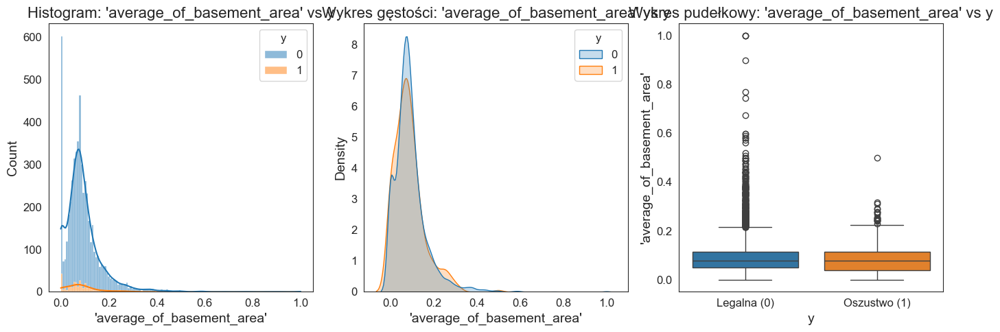

--------------------------------------------------

Cecha numeryczna: 'average_years_of_beginning_exploitation'
Statystyki opisowe:
    count      mean       std     min     25%     50%     75%  max
y                                                                 
0  5092.0  0.982828  0.011648  0.4948  0.9781  0.9831  0.9881  1.0
1   326.0  0.982254  0.007576  0.9578  0.9771  0.9826  0.9871  1.0


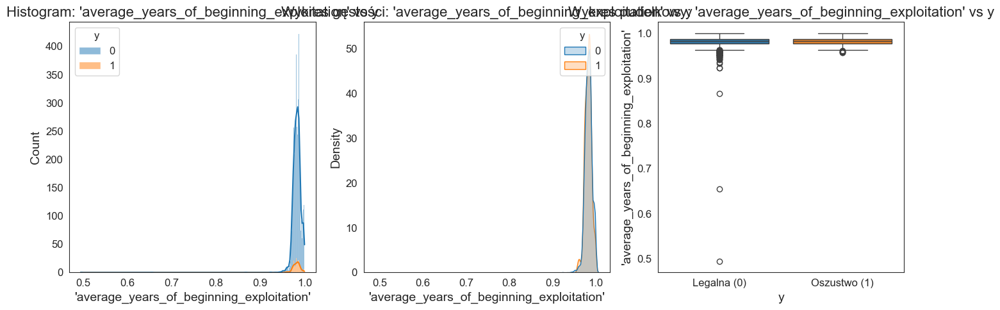

--------------------------------------------------

Cecha numeryczna: 'average_years_of_building'
Statystyki opisowe:
    count      mean       std    min     25%     50%     75%  max
y                                                                
0  5092.0  0.766591  0.112293  0.000  0.7008  0.7688  0.8368  1.0
1   326.0  0.754950  0.103570  0.422  0.6821  0.7620  0.8215  1.0


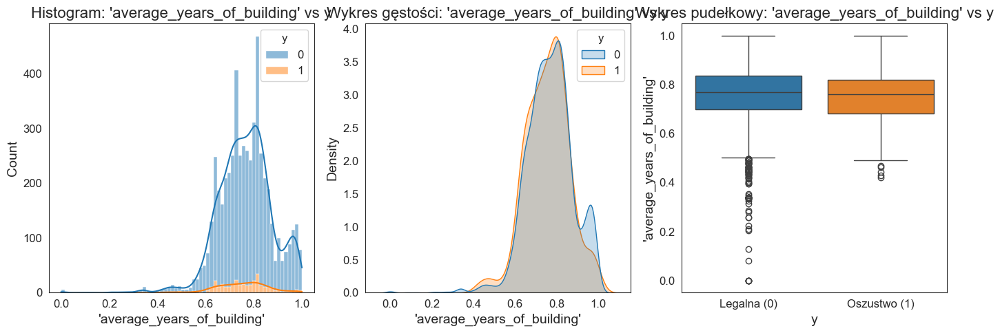

--------------------------------------------------

Cecha numeryczna: 'average_of_common_area'
Statystyki opisowe:
    count      mean       std  min     25%      50%     75%     max
y                                                                  
0  5092.0  0.048340  0.079165  0.0  0.0085  0.02440  0.0576  1.0000
1   326.0  0.040758  0.055406  0.0  0.0078  0.01995  0.0521  0.3543


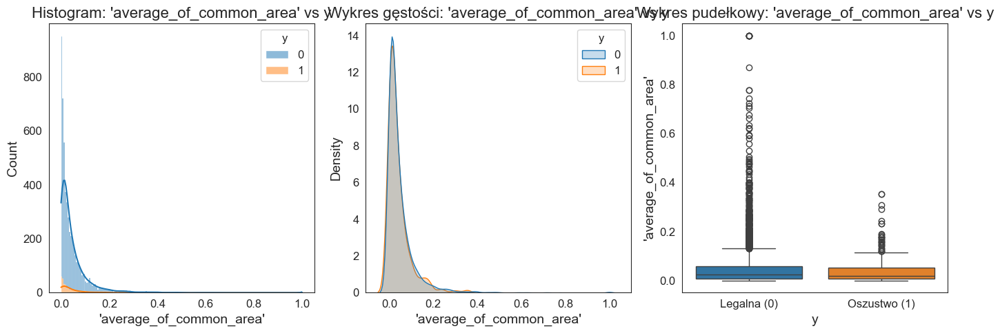

--------------------------------------------------

Cecha numeryczna: 'average_of_elevators'
Statystyki opisowe:
    count      mean       std  min  25%  50%   75%  max
y                                                      
0  5092.0  0.089379  0.142099  0.0  0.0  0.0  0.16  1.0
1   326.0  0.073080  0.130617  0.0  0.0  0.0  0.12  1.0


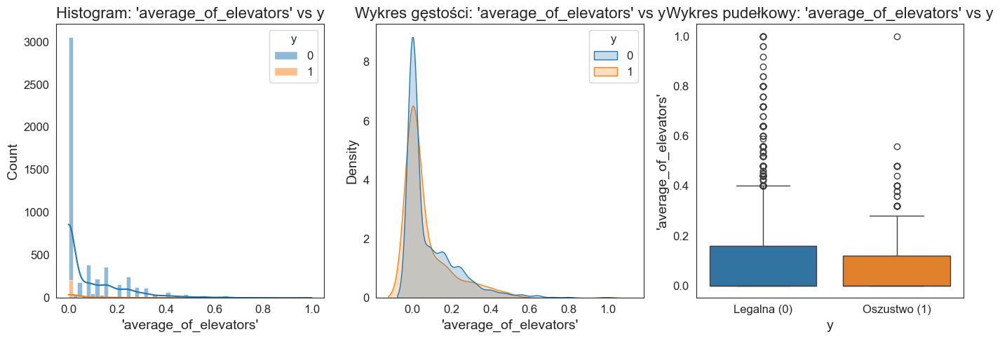

--------------------------------------------------

Cecha numeryczna: 'average_of_entrances'
Statystyki opisowe:
    count      mean       std     min     25%     50%     75%     max
y                                                                    
0  5092.0  0.156319  0.097565  0.0000  0.1034  0.1379  0.2069  1.0000
1   326.0  0.150040  0.085897  0.0345  0.0862  0.1379  0.2069  0.4828


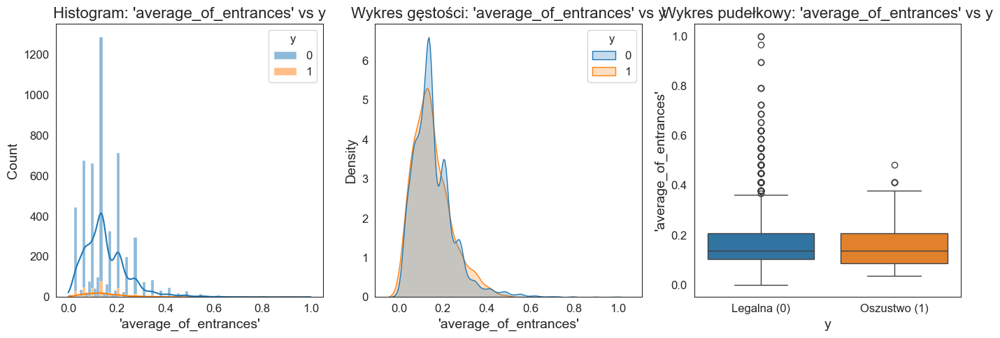

--------------------------------------------------

Cecha numeryczna: 'maximum_of_floors'
Statystyki opisowe:
    count      mean       std  min     25%     50%     75%     max
y                                                                 
0  5092.0  0.251228  0.148606  0.0  0.1667  0.1667  0.3333  1.0000
1   326.0  0.224210  0.129251  0.0  0.1667  0.1667  0.3333  0.6667


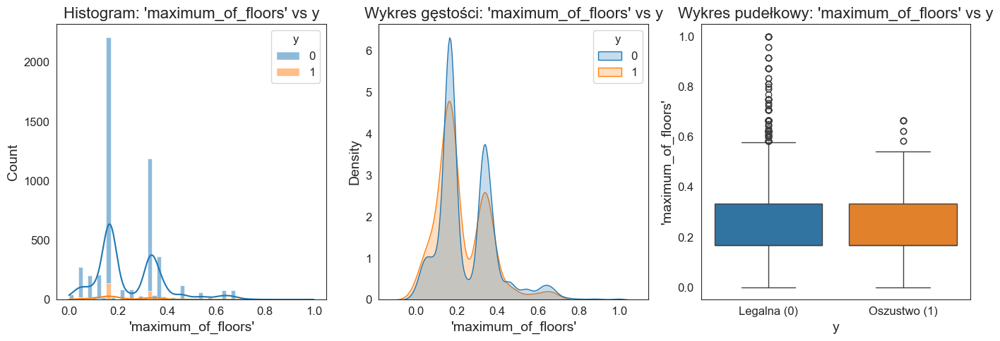

--------------------------------------------------

Cecha numeryczna: 'minimum_of_floors'
Statystyki opisowe:
    count      mean       std  min     25%     50%    75%     max
y                                                                
0  5092.0  0.243739  0.162880  0.0  0.1250  0.2083  0.375  1.0000
1   326.0  0.216156  0.150955  0.0  0.0833  0.2083  0.375  0.7083


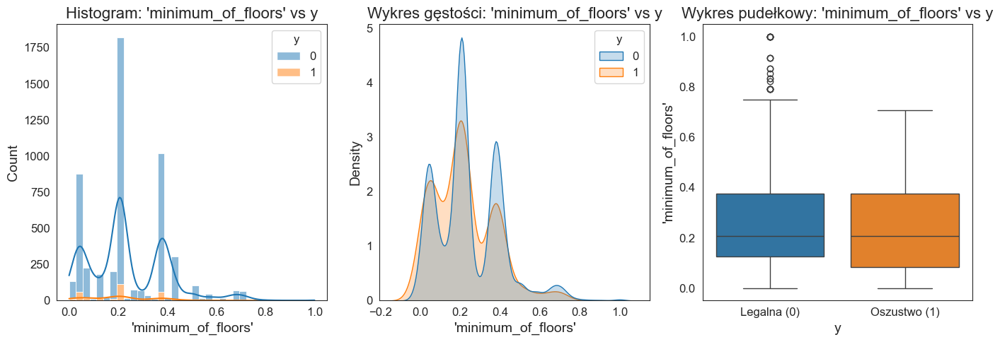

--------------------------------------------------

Cecha numeryczna: 'average_of_land_area'
Statystyki opisowe:
    count      mean       std  min       25%      50%       75%  max
y                                                                   
0  5092.0  0.068469  0.080312  0.0  0.020500  0.05015  0.088950  1.0
1   326.0  0.062075  0.081358  0.0  0.017625  0.04530  0.083025  1.0


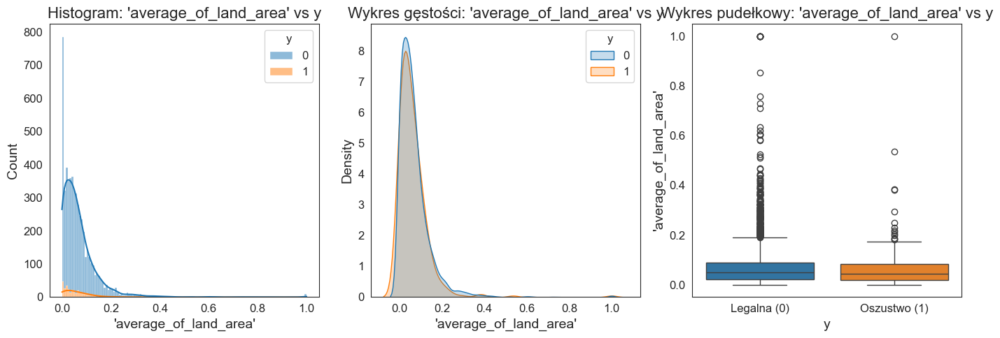

--------------------------------------------------

Cecha numeryczna: 'average_of_living_apartments'
Statystyki opisowe:
    count      mean       std  min       25%      50%       75%     max
y                                                                      
0  5092.0  0.106282  0.098060  0.0  0.050400  0.07650  0.127800  1.0000
1   326.0  0.092124  0.074635  0.0  0.048125  0.07395  0.118325  0.3976


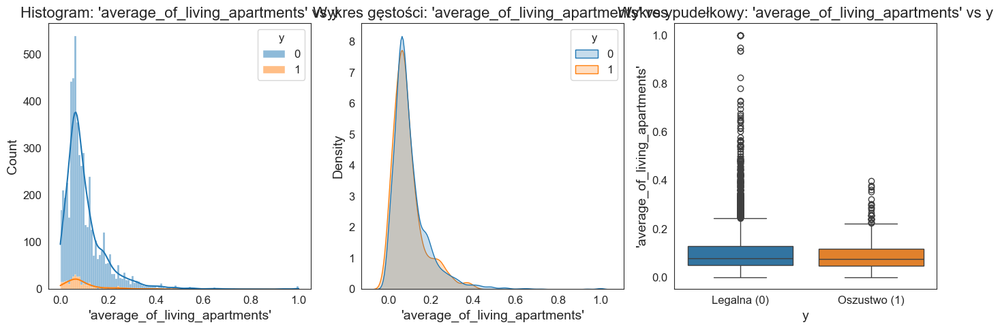

--------------------------------------------------

Cecha numeryczna: 'average_of_living_area'
Statystyki opisowe:
    count      mean       std     min     25%      50%       75%  max
y                                                                    
0  5092.0  0.123525  0.119221  0.0000  0.0542  0.08430  0.153425  1.0
1   326.0  0.106053  0.105537  0.0012  0.0508  0.07605  0.120100  1.0


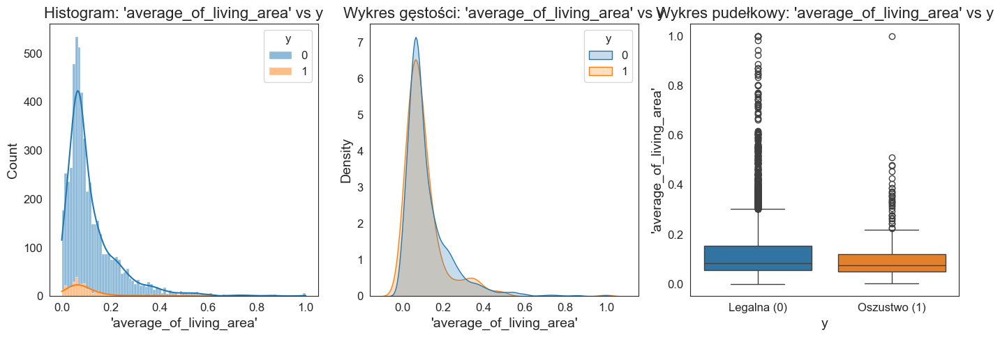

--------------------------------------------------

Cecha numeryczna: 'average_of_non-living_apartments'
Statystyki opisowe:
    count      mean       std  min  25%  50%     75%  max
y                                                        
0  5092.0  0.009532  0.050562  0.0  0.0  0.0  0.0064  1.0
1   326.0  0.013588  0.086573  0.0  0.0  0.0  0.0039  1.0


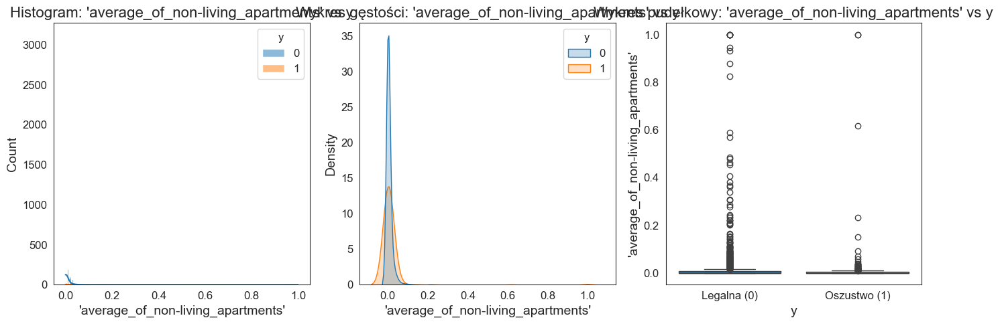

--------------------------------------------------

Cecha numeryczna: 'average_of_non-living_area'
Statystyki opisowe:
    count      mean       std  min  25%     50%       75%     max
y                                                                
0  5092.0  0.027337  0.067109  0.0  0.0  0.0029  0.026400  1.0000
1   326.0  0.020858  0.053550  0.0  0.0  0.0015  0.019525  0.6511


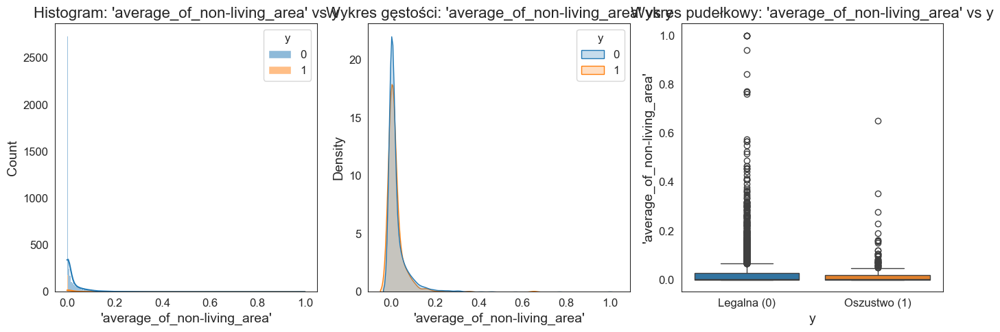

--------------------------------------------------

Cecha numeryczna: 'apartment_mode'
Statystyki opisowe:
    count      mean       std  min     25%     50%      75%     max
y                                                                  
0  5092.0  0.126578  0.116509  0.0  0.0630  0.0935  0.15130  1.0000
1   326.0  0.113144  0.095307  0.0  0.0536  0.0851  0.14495  0.5053


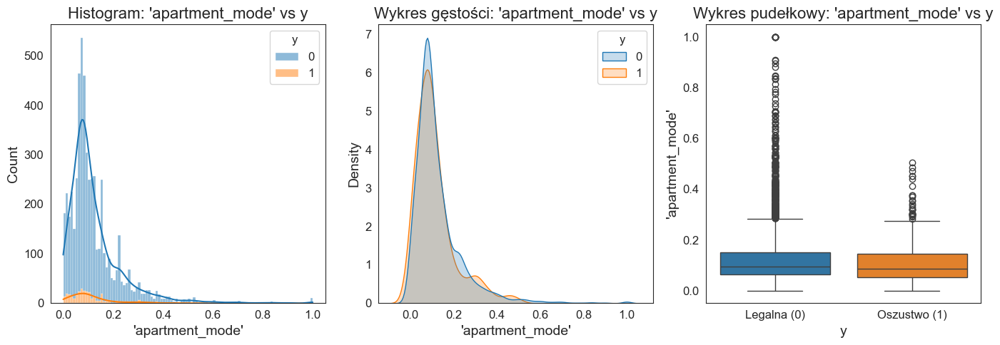

--------------------------------------------------

Cecha numeryczna: 'basement_area_mode'
Statystyki opisowe:
    count      mean       std  min     25%      50%       75%     max
y                                                                    
0  5092.0  0.090812  0.082096  0.0  0.0442  0.07780  0.115625  1.0000
1   326.0  0.086516  0.074379  0.0  0.0358  0.07605  0.115475  0.5179


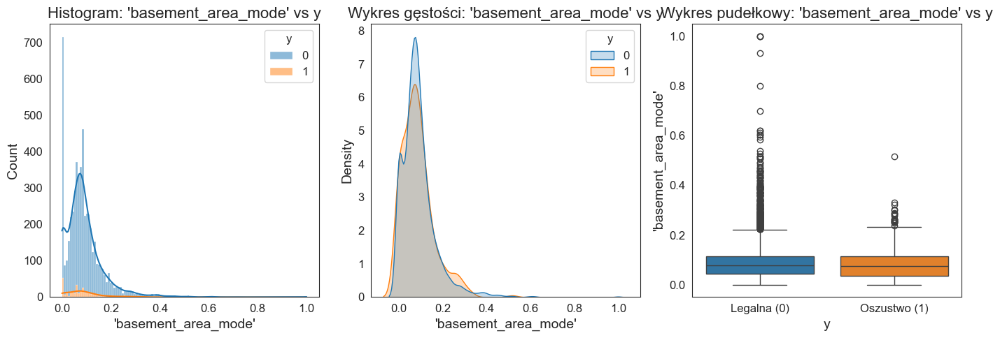

--------------------------------------------------

Cecha numeryczna: 'years_beginning_exploitation_mode'
Statystyki opisowe:
    count      mean       std     min     25%     50%     75%  max
y                                                                 
0  5092.0  0.982333  0.021131  0.0005  0.9777  0.9826  0.9876  1.0
1   326.0  0.982052  0.007732  0.9578  0.9767  0.9821  0.9866  1.0


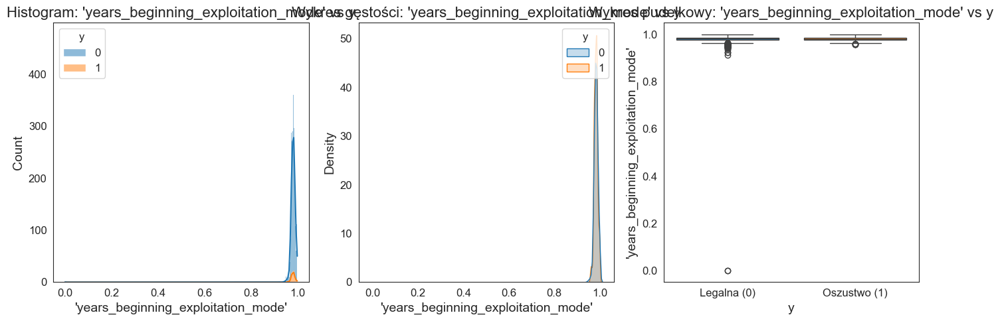

--------------------------------------------------

Cecha numeryczna: 'years_building_mode'
Statystyki opisowe:
    count      mean       std     min     25%     50%     75%  max
y                                                                 
0  5092.0  0.772861  0.109670  0.0000  0.7060  0.7779  0.8367  1.0
1   326.0  0.762225  0.100478  0.4446  0.6929  0.7648  0.8236  1.0


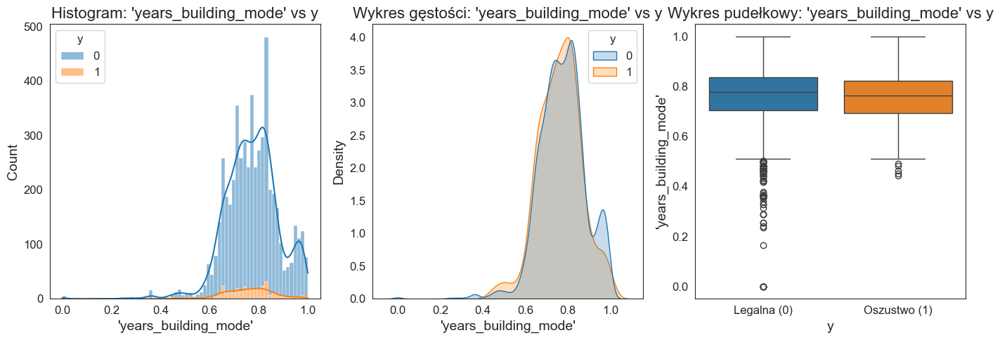

--------------------------------------------------

Cecha numeryczna: 'common_area_mode'
Statystyki opisowe:
    count      mean       std  min     25%      50%       75%     max
y                                                                    
0  5092.0  0.045904  0.077522  0.0  0.0079  0.02230  0.054625  1.0000
1   326.0  0.039765  0.055660  0.0  0.0075  0.01955  0.050175  0.3576


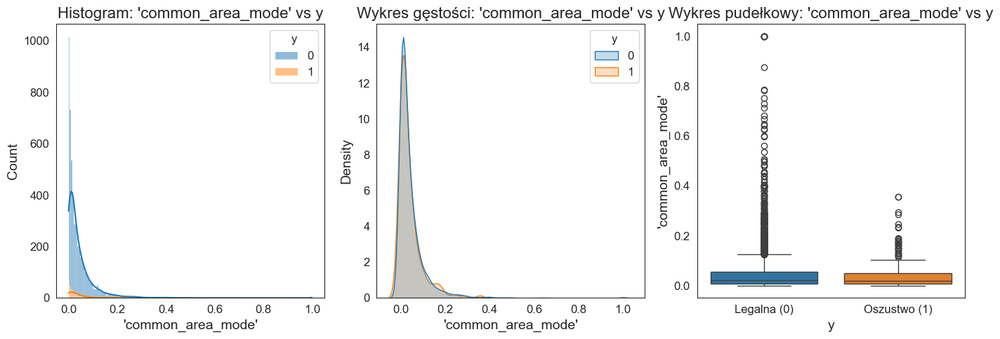

--------------------------------------------------

Cecha numeryczna: 'elevators_mode'
Statystyki opisowe:
    count      mean       std  min  25%  50%     75%  max
y                                                        
0  5092.0  0.083765  0.139392  0.0  0.0  0.0  0.1611  1.0
1   326.0  0.069914  0.130690  0.0  0.0  0.0  0.0806  1.0


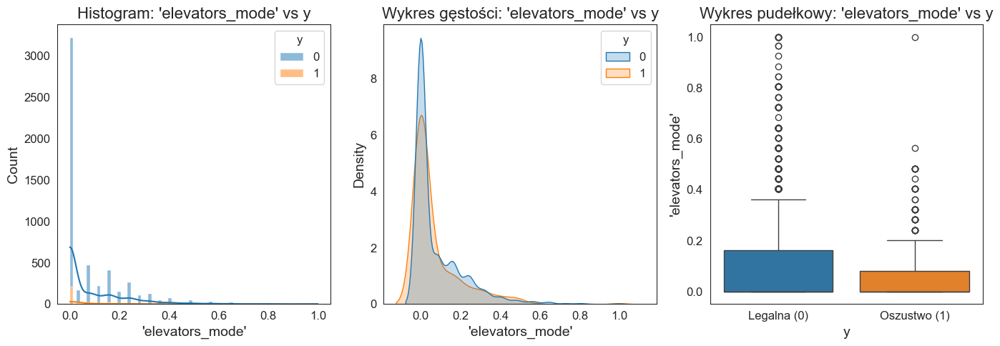

--------------------------------------------------

Cecha numeryczna: 'entrances_mode'
Statystyki opisowe:
    count      mean       std     min    25%     50%     75%     max
y                                                                   
0  5092.0  0.150820  0.099605  0.0000  0.069  0.1379  0.2069  1.0000
1   326.0  0.145753  0.088878  0.0345  0.069  0.1379  0.2069  0.4828


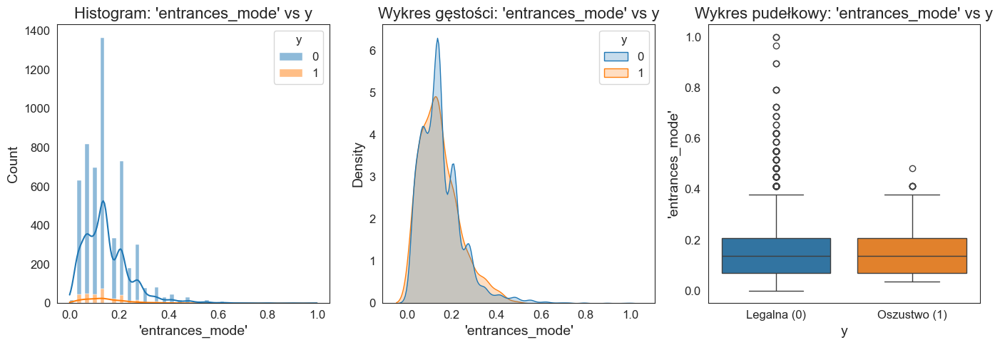

--------------------------------------------------

Cecha numeryczna: 'floors_max_mode'
Statystyki opisowe:
    count      mean       std  min     25%     50%     75%     max
y                                                                 
0  5092.0  0.246218  0.148665  0.0  0.1667  0.1667  0.3333  1.0000
1   326.0  0.219460  0.128167  0.0  0.1667  0.1667  0.3333  0.6667


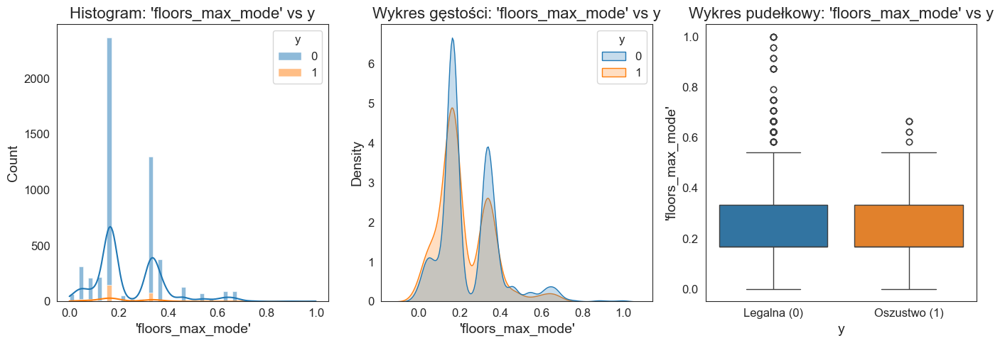

--------------------------------------------------

Cecha numeryczna: 'floors_min_mode'
Statystyki opisowe:
    count      mean       std  min     25%     50%    75%     max
y                                                                
0  5092.0  0.239137  0.163267  0.0  0.1250  0.2083  0.375  1.0000
1   326.0  0.212802  0.152069  0.0  0.0833  0.2083  0.375  0.7083


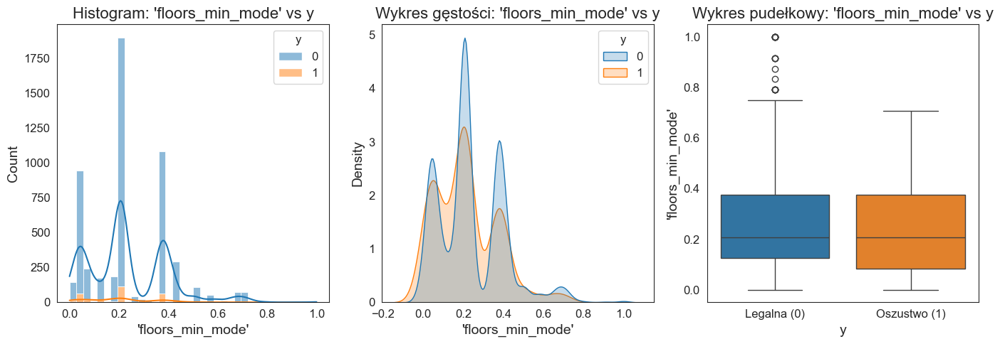

--------------------------------------------------

Cecha numeryczna: 'land_area_mode'
Statystyki opisowe:
    count      mean       std  min      25%      50%       75%  max
y                                                                  
0  5092.0  0.066681  0.080704  0.0  0.01800  0.04735  0.087500  1.0
1   326.0  0.061166  0.082576  0.0  0.01565  0.04295  0.082375  1.0


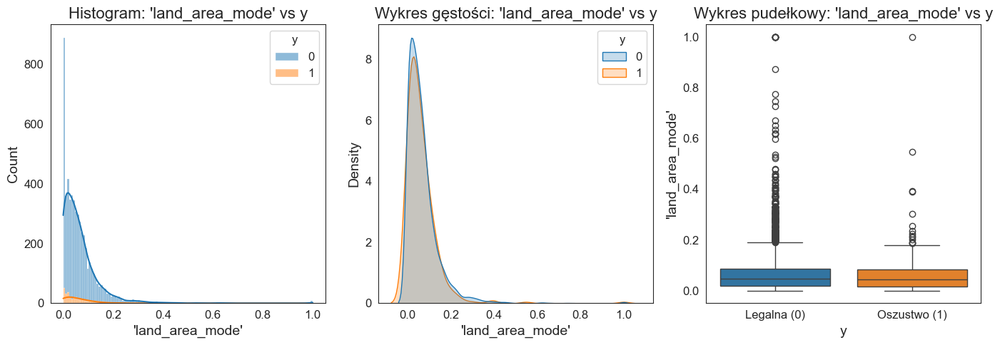

--------------------------------------------------

Cecha numeryczna: 'living_apartments_mode'
Statystyki opisowe:
    count      mean       std  min     25%      50%       75%     max
y                                                                    
0  5092.0  0.110963  0.103587  0.0  0.0551  0.08170  0.132200  1.0000
1   326.0  0.097672  0.081119  0.0  0.0478  0.07395  0.122625  0.4343


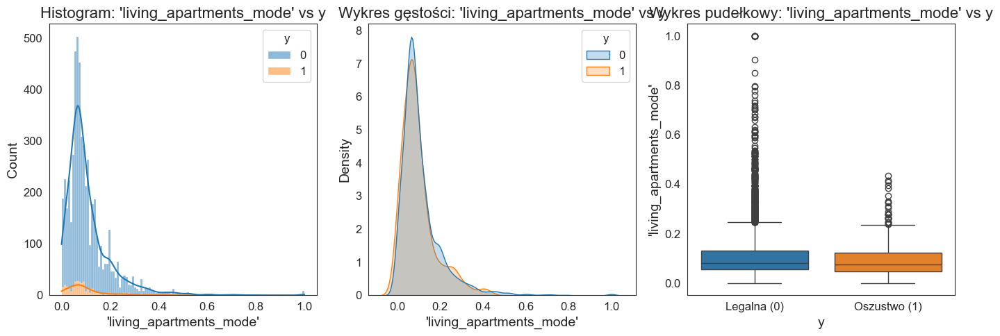

--------------------------------------------------

Cecha numeryczna: 'living_area_mode'
Statystyki opisowe:
    count      mean       std  min       25%      50%       75%    max
y                                                                     
0  5092.0  0.120434  0.120821  0.0  0.053400  0.08115  0.146925  1.000
1   326.0  0.102980  0.096733  0.0  0.045225  0.07445  0.118950  0.531


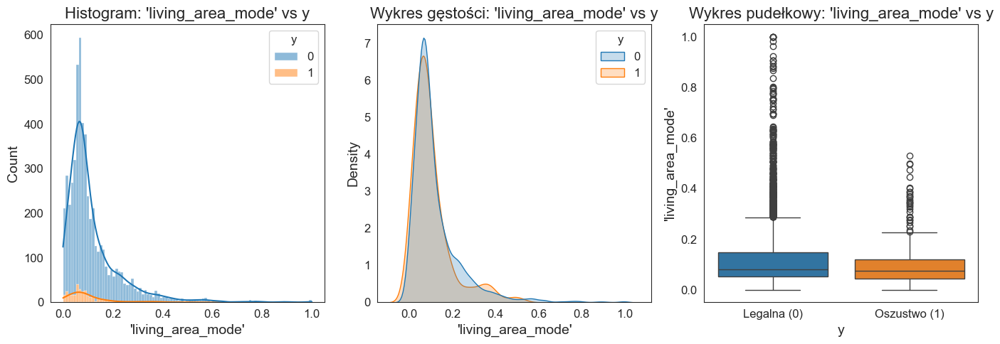

--------------------------------------------------

Cecha numeryczna: 'non-living_apartments_mode'
Statystyki opisowe:
    count      mean       std  min  25%  50%     75%  max
y                                                        
0  5092.0  0.008535  0.048964  0.0  0.0  0.0  0.0039  1.0
1   326.0  0.013325  0.086724  0.0  0.0  0.0  0.0039  1.0


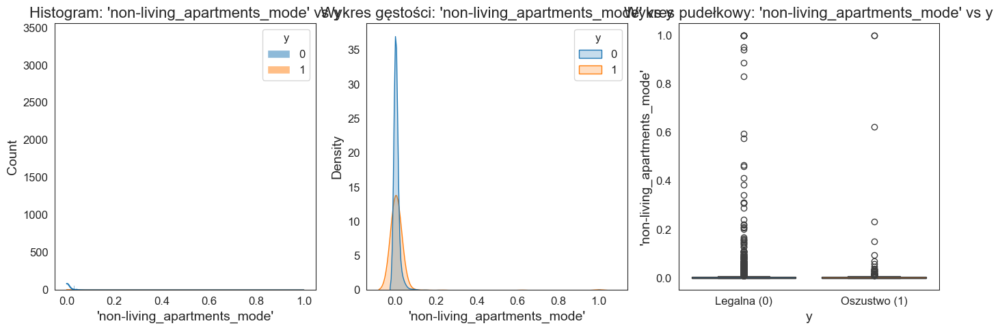

--------------------------------------------------

Cecha numeryczna: 'non-living_area_mode'
Statystyki opisowe:
    count      mean       std  min  25%  50%     75%     max
y                                                           
0  5092.0  0.024765  0.065383  0.0  0.0  0.0  0.0196  1.0000
1   326.0  0.019687  0.056576  0.0  0.0  0.0  0.0125  0.6893


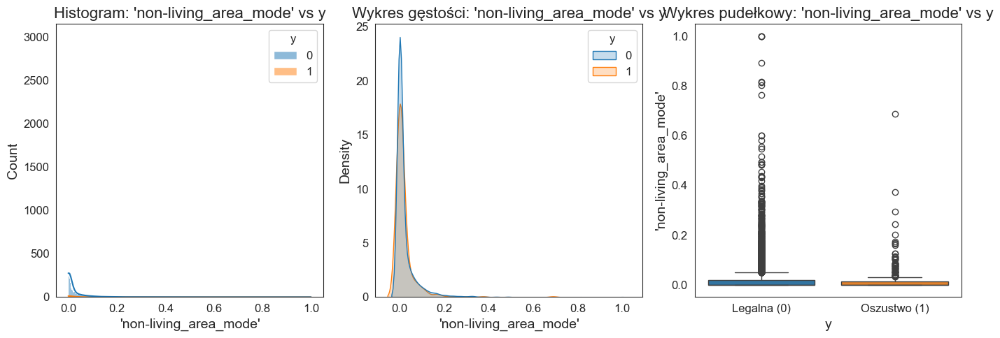

--------------------------------------------------

Cecha numeryczna: 'apartments_median'
Statystyki opisowe:
    count      mean       std     min     25%     50%      75%     max
y                                                                     
0  5092.0  0.131608  0.117200  0.0000  0.0635  0.0937  0.15820  1.0000
1   326.0  0.115419  0.093794  0.0021  0.0625  0.0916  0.14545  0.5007


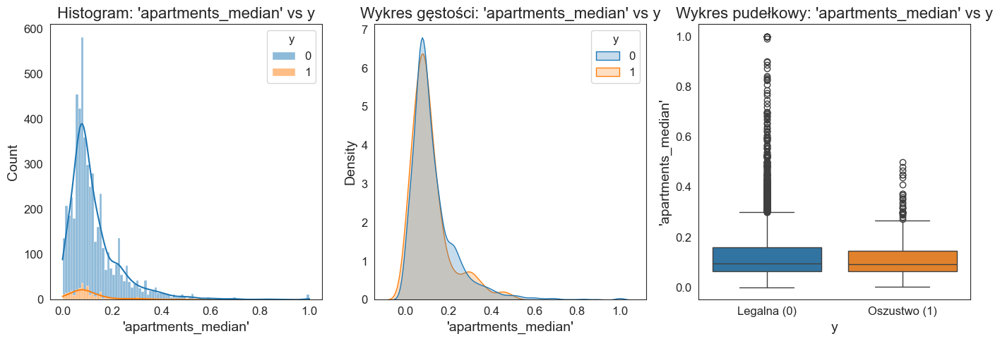

--------------------------------------------------

Cecha numeryczna: 'basement_area_median'
Statystyki opisowe:
    count      mean       std  min     25%      50%     75%     max
y                                                                  
0  5092.0  0.092132  0.080174  0.0  0.0483  0.07850  0.1151  1.0000
1   326.0  0.085590  0.070592  0.0  0.0395  0.07635  0.1138  0.4991


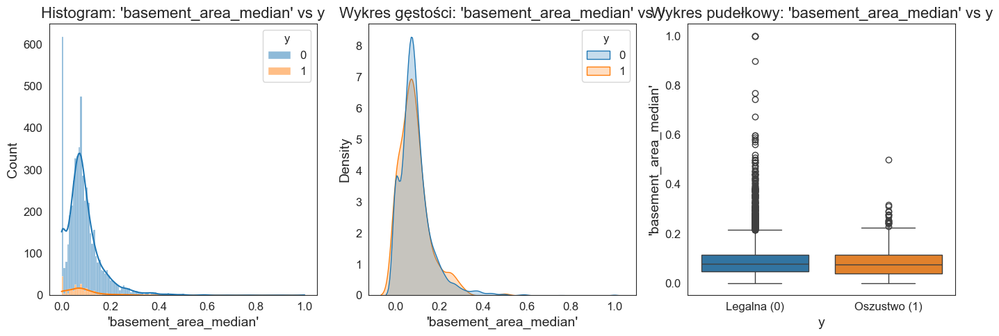

--------------------------------------------------

Cecha numeryczna: 'median_years_of_beginning_exploitation'
Statystyki opisowe:
    count      mean       std     min     25%     50%     75%  max
y                                                                 
0  5092.0  0.982936  0.010603  0.4948  0.9781  0.9831  0.9881  1.0
1   326.0  0.982302  0.007641  0.9578  0.9771  0.9826  0.9871  1.0


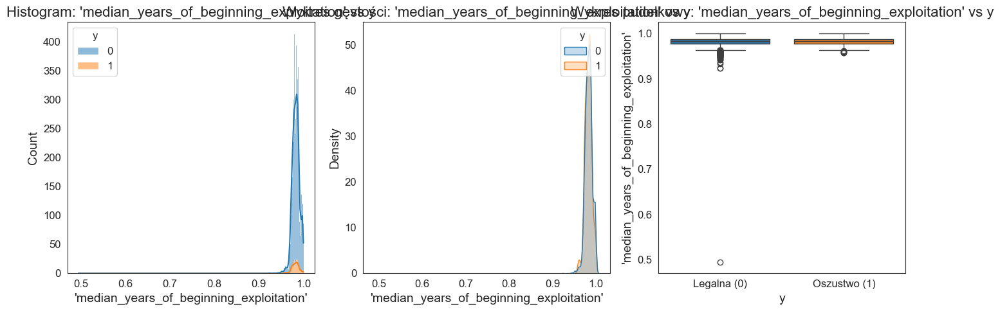

--------------------------------------------------

Cecha numeryczna: 'median_years_of_building'
Statystyki opisowe:
    count      mean       std     min       25%      50%       75%  max
y                                                                      
0  5092.0  0.769906  0.111167  0.0000  0.704800  0.77190  0.839000  1.0
1   326.0  0.758781  0.102760  0.4297  0.686375  0.76185  0.823925  1.0


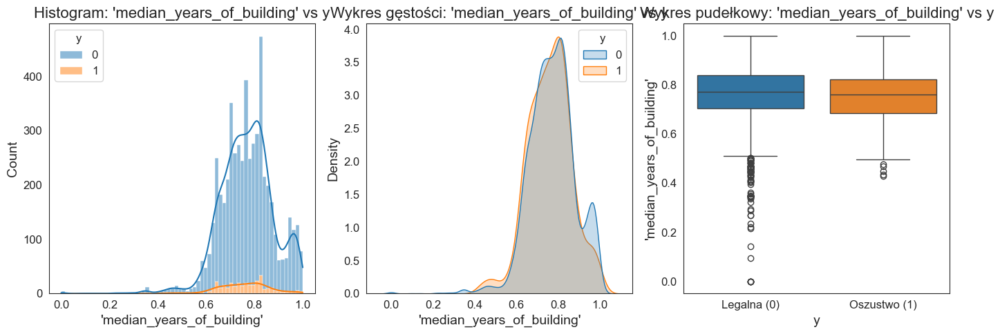

--------------------------------------------------

Cecha numeryczna: 'median_of_common_area'
Statystyki opisowe:
    count      mean       std  min     25%     50%       75%     max
y                                                                   
0  5092.0  0.048394  0.079658  0.0  0.0084  0.0244  0.057625  1.0000
1   326.0  0.040894  0.055409  0.0  0.0079  0.0201  0.052775  0.3566


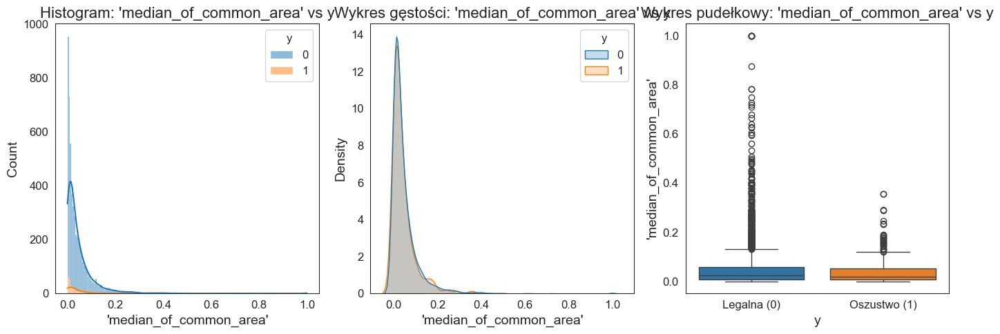

--------------------------------------------------

Cecha numeryczna: 'median_of_elevators'
Statystyki opisowe:
    count      mean       std  min  25%  50%   75%  max
y                                                      
0  5092.0  0.088342  0.141960  0.0  0.0  0.0  0.16  1.0
1   326.0  0.072822  0.131139  0.0  0.0  0.0  0.12  1.0


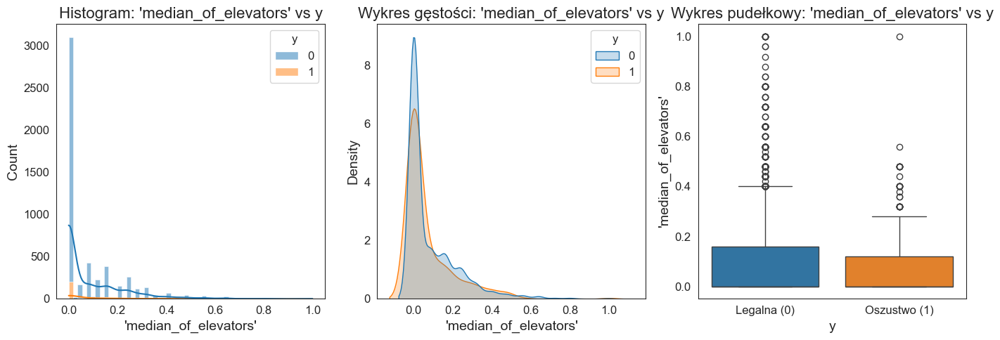

--------------------------------------------------

Cecha numeryczna: 'median_of_entrances'
Statystyki opisowe:
    count      mean      std     min     25%     50%     75%     max
y                                                                   
0  5092.0  0.155742  0.09805  0.0000  0.1034  0.1379  0.2069  1.0000
1   326.0  0.149667  0.08772  0.0345  0.0690  0.1379  0.2069  0.4828


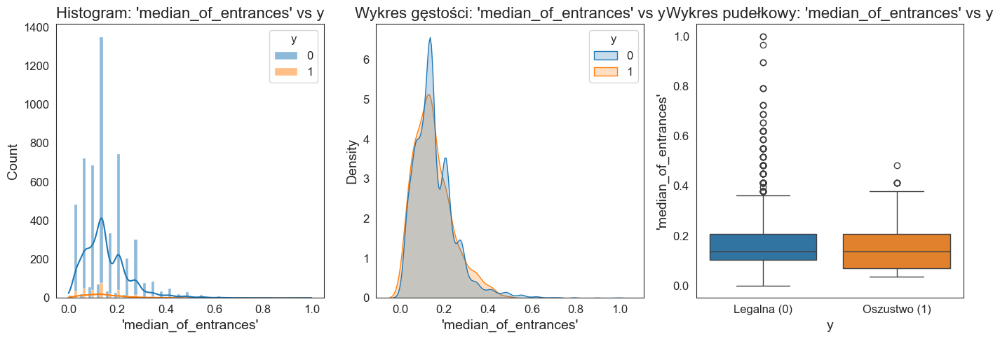

--------------------------------------------------

Cecha numeryczna: 'median_of_floors_max'
Statystyki opisowe:
    count      mean       std  min     25%     50%     75%     max
y                                                                 
0  5092.0  0.250935  0.149672  0.0  0.1667  0.1667  0.3333  1.0000
1   326.0  0.223997  0.128551  0.0  0.1667  0.1667  0.3333  0.6667


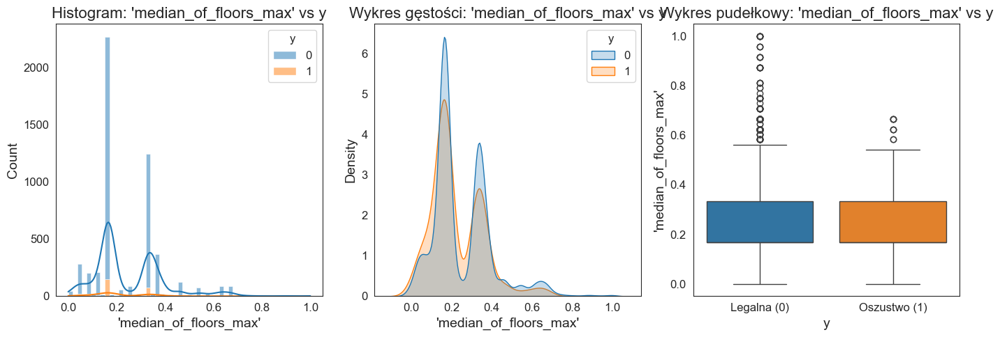

--------------------------------------------------

Cecha numeryczna: 'median_of_floors_min'
Statystyki opisowe:
    count      mean       std  min     25%     50%    75%     max
y                                                                
0  5092.0  0.243486  0.163839  0.0  0.1250  0.2083  0.375  1.0000
1   326.0  0.215294  0.150895  0.0  0.0833  0.2083  0.375  0.7083


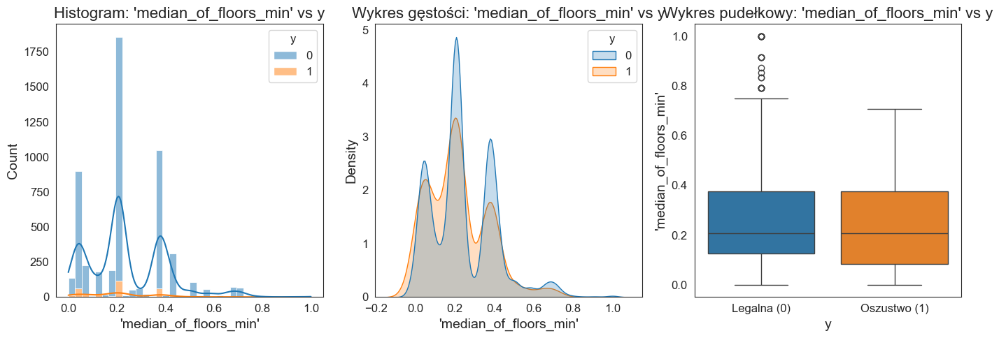

--------------------------------------------------

Cecha numeryczna: 'median_of_land_area'
Statystyki opisowe:
    count      mean       std  min     25%     50%      75%  max
y                                                               
0  5092.0  0.069261  0.080683  0.0  0.0206  0.0505  0.09030  1.0
1   326.0  0.062843  0.082162  0.0  0.0177  0.0461  0.08335  1.0


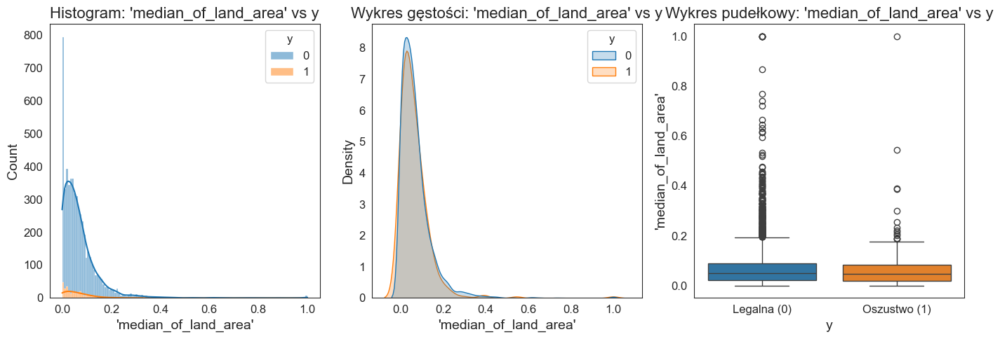

--------------------------------------------------

Cecha numeryczna: 'median_of_living_apartments'
Statystyki opisowe:
    count      mean       std  min       25%      50%       75%     max
y                                                                      
0  5092.0  0.107547  0.099545  0.0  0.051300  0.07700  0.128300  1.0000
1   326.0  0.093790  0.076082  0.0  0.048925  0.07395  0.120375  0.4045


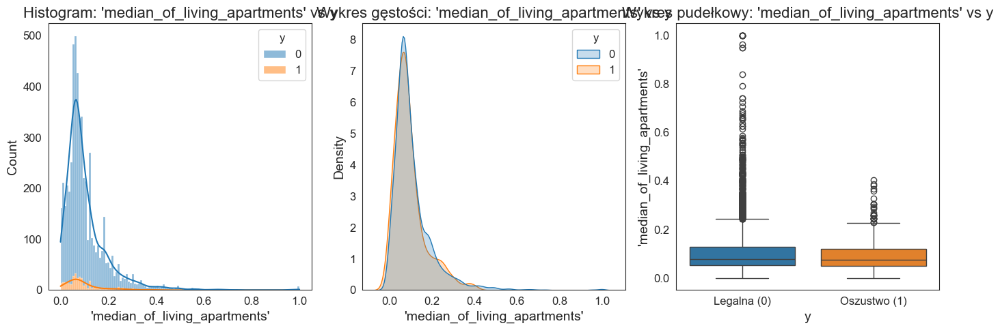

--------------------------------------------------

Cecha numeryczna: 'median_of_living_area'
Statystyki opisowe:
    count      mean       std     min     25%     50%       75%  max
y                                                                   
0  5092.0  0.124969  0.121433  0.0000  0.0549  0.0853  0.154700  1.0
1   326.0  0.107629  0.106889  0.0013  0.0517  0.0774  0.121425  1.0


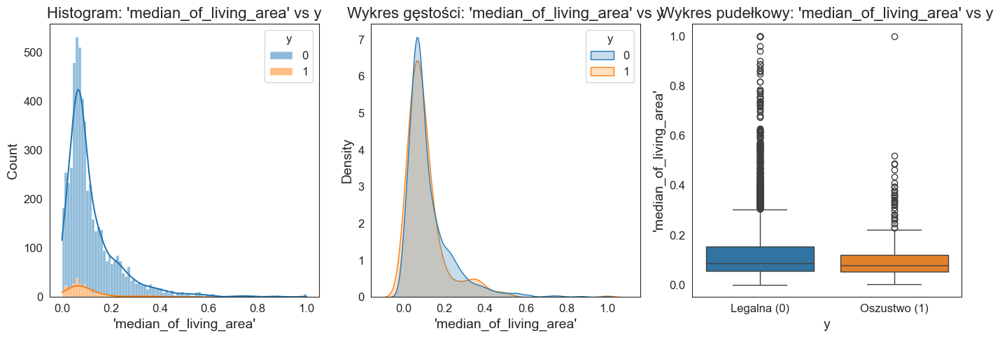

--------------------------------------------------

Cecha numeryczna: 'median_of_non-living_apartments'
Statystyki opisowe:
    count      mean       std  min  25%  50%     75%  max
y                                                        
0  5092.0  0.009201  0.050006  0.0  0.0  0.0  0.0039  1.0
1   326.0  0.013540  0.086667  0.0  0.0  0.0  0.0039  1.0


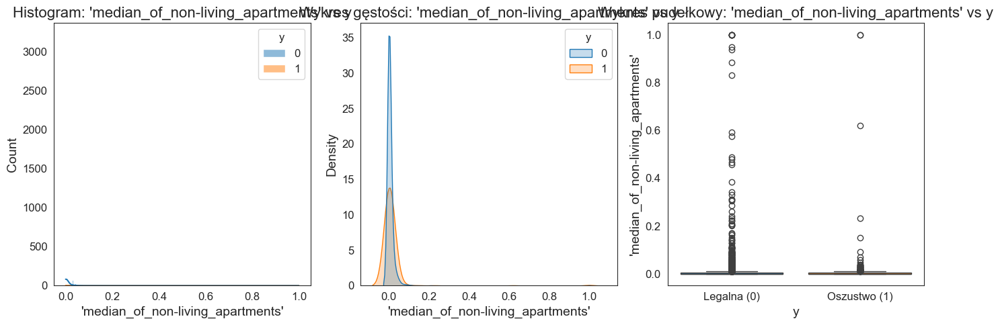

--------------------------------------------------

Cecha numeryczna: 'median_of_non-living_area'
Statystyki opisowe:
    count      mean       std  min  25%      50%       75%     max
y                                                                 
0  5092.0  0.027091  0.068009  0.0  0.0  0.00200  0.025225  1.0000
1   326.0  0.020663  0.054721  0.0  0.0  0.00095  0.018075  0.6648


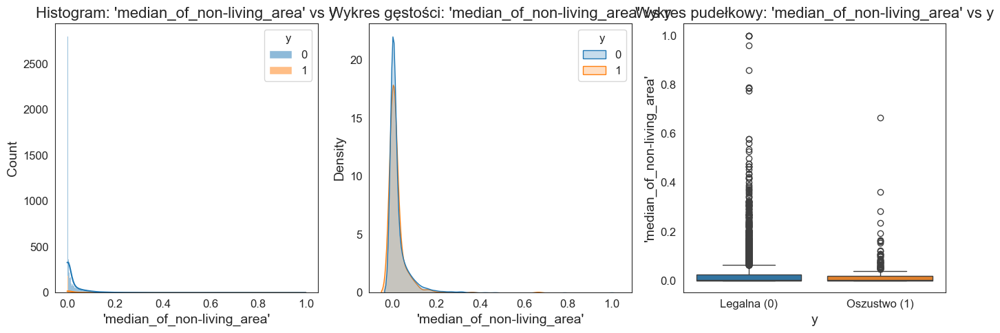

--------------------------------------------------

Cecha numeryczna: 'total_area_mode'
Statystyki opisowe:
    count      mean       std     min       25%     50%      75%     max
y                                                                       
0  5092.0  0.121395  0.120233  0.0000  0.051175  0.0780  0.16015  1.0000
1   326.0  0.102093  0.095786  0.0019  0.046700  0.0702  0.11785  0.5388


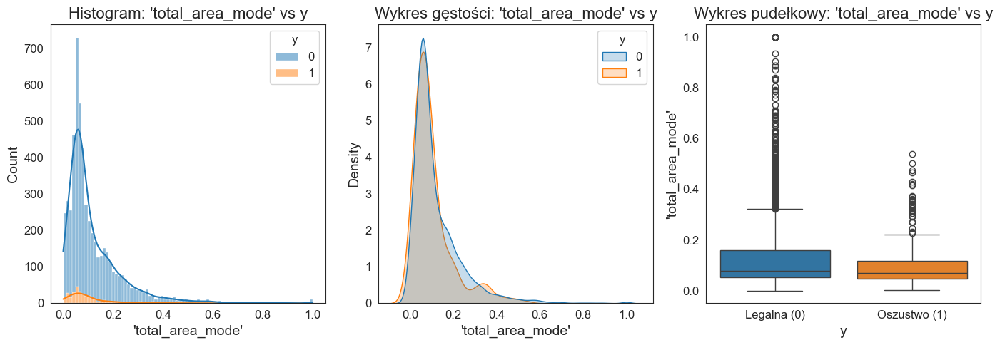

--------------------------------------------------

Cecha numeryczna: 'number_of_SOCIAL_CIRCLE_OBS'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%   max
y                                                      
0  5092.0  1.363511  2.240067  0.0  0.0  0.0  2.0  27.0
1   326.0  1.622699  2.304906  0.0  0.0  1.0  3.0  14.0


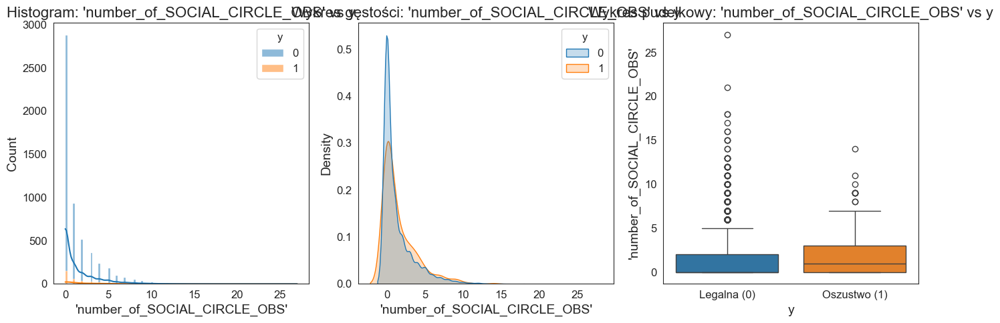

--------------------------------------------------

Cecha numeryczna: 'number_of_CNT_SOCIAL_CIRCLE_DEF'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.088374  0.326957  0.0  0.0  0.0  0.0  3.0
1   326.0  0.128834  0.370401  0.0  0.0  0.0  0.0  2.0


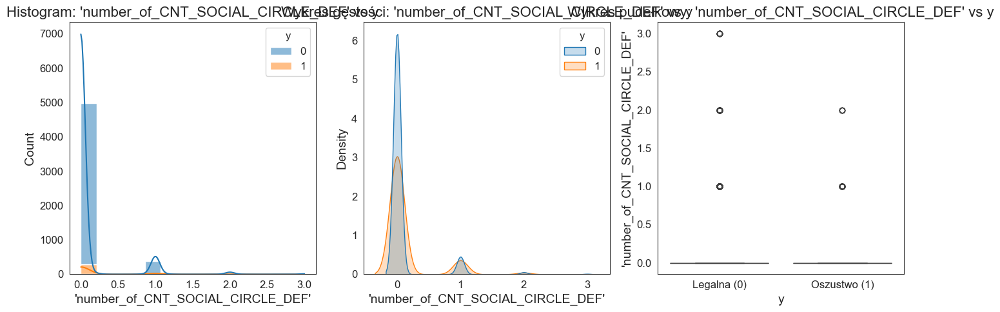

--------------------------------------------------

Cecha numeryczna: 'days_of_last_phone_change'
Statystyki opisowe:
    count         mean         std     min      25%    50%     75%  max
y                                                                      
0  5092.0 -1106.753535  867.037079 -4131.0 -1734.25 -956.0 -385.75  0.0
1   326.0 -1015.319018  830.477773 -3445.0 -1674.50 -782.0 -360.75  0.0


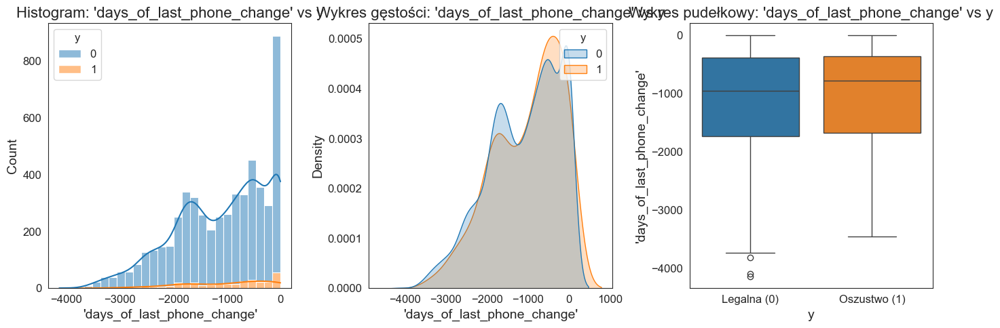

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_2'
Statystyki opisowe:
    count  mean  std  min  25%  50%  75%  max
y                                            
0  5092.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
1   326.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0

Cecha numeryczna: 'DOCUMENT_3'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.652985  0.476067  0.0  0.0  1.0  1.0  1.0
1   326.0  0.733129  0.443004  0.0  0.0  1.0  1.0  1.0


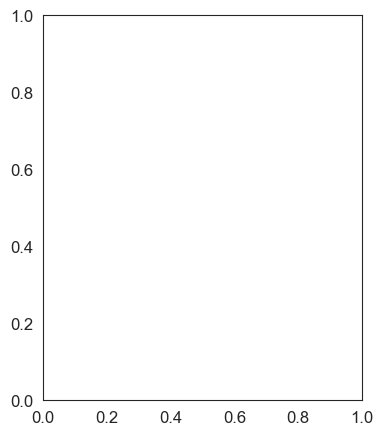

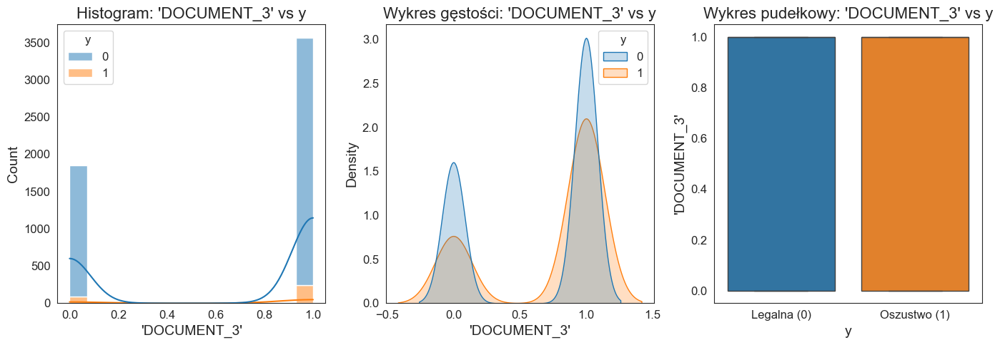

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_4'
Statystyki opisowe:
    count  mean  std  min  25%  50%  75%  max
y                                            
0  5092.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
1   326.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0

Cecha numeryczna: 'DOCUMENT_5'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.013158  0.113962  0.0  0.0  0.0  0.0  1.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


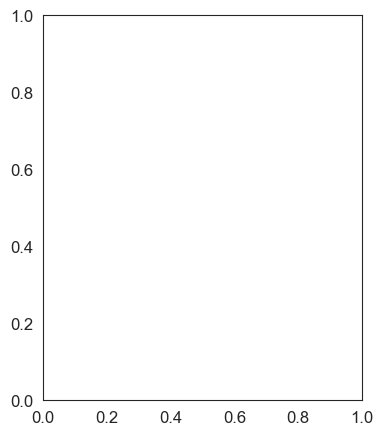

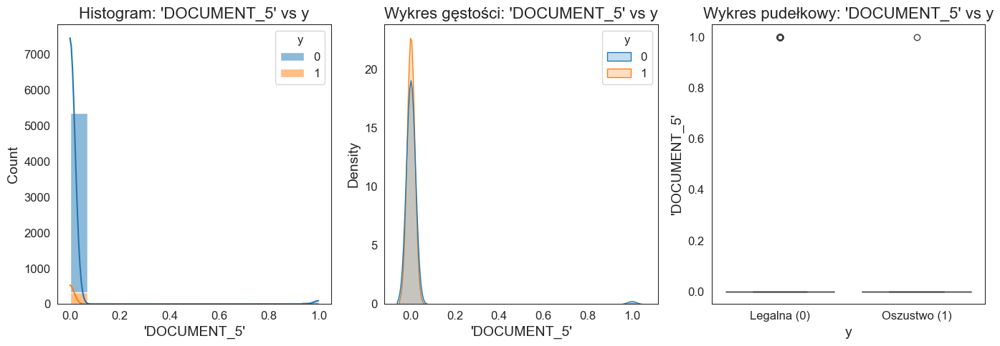

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_6'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.004713  0.068498  0.0  0.0  0.0  0.0  1.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


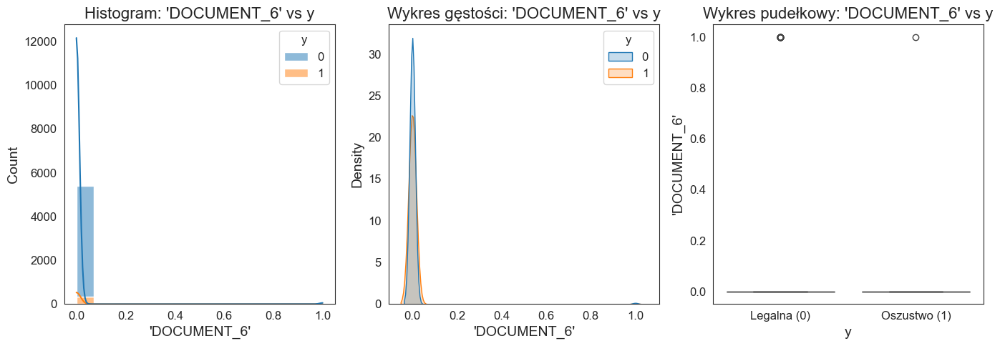

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_7'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


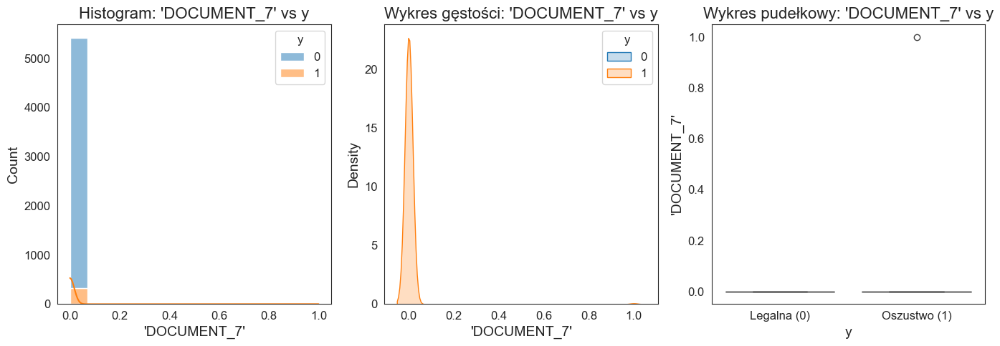

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_8'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.202278  0.401738  0.0  0.0  0.0  0.0  1.0
1   326.0  0.208589  0.406924  0.0  0.0  0.0  0.0  1.0


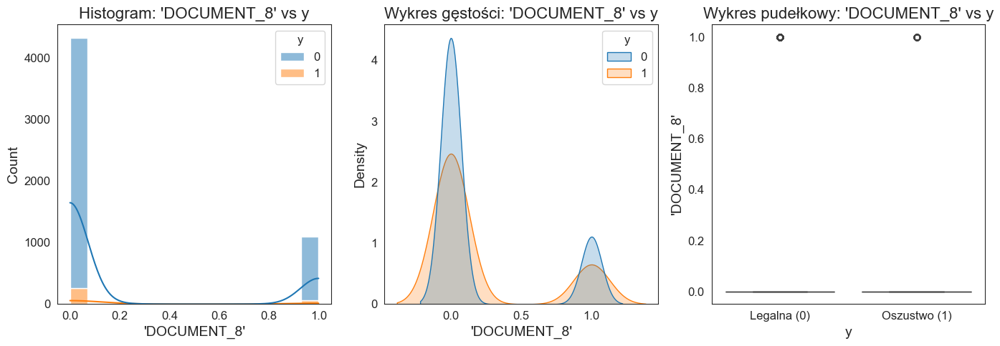

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_9'
Statystyki opisowe:
    count     mean       std  min  25%  50%  75%  max
y                                                    
0  5092.0  0.00491  0.069904  0.0  0.0  0.0  0.0  1.0
1   326.0  0.00000  0.000000  0.0  0.0  0.0  0.0  0.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


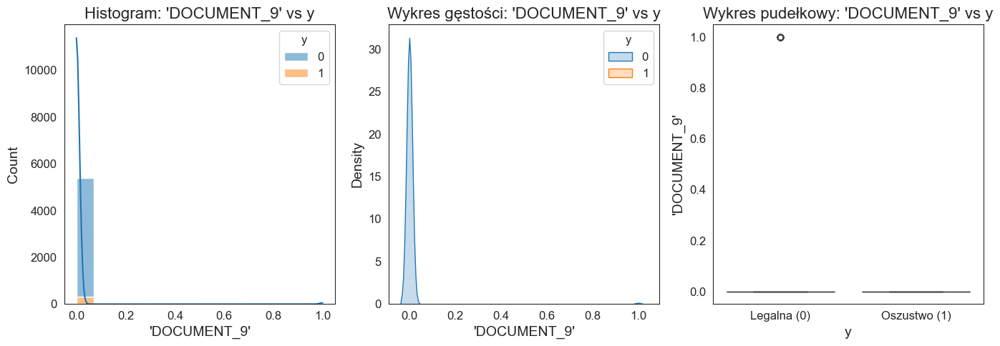

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_10'
Statystyki opisowe:
    count  mean  std  min  25%  50%  75%  max
y                                            
0  5092.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
1   326.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0

Cecha numeryczna: 'DOCUMENT_11'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.007659  0.087189  0.0  0.0  0.0  0.0  1.0
1   326.0  0.006135  0.078205  0.0  0.0  0.0  0.0  1.0


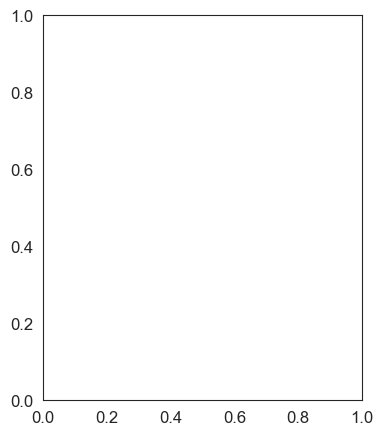

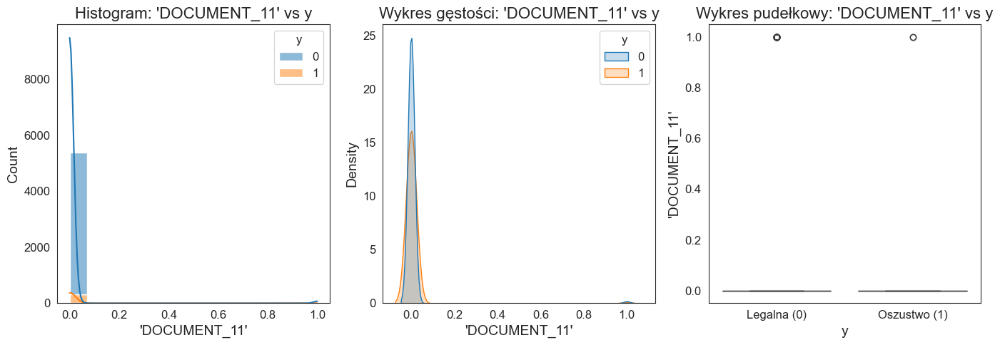

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_12'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.000196  0.014014  0.0  0.0  0.0  0.0  1.0
1   326.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


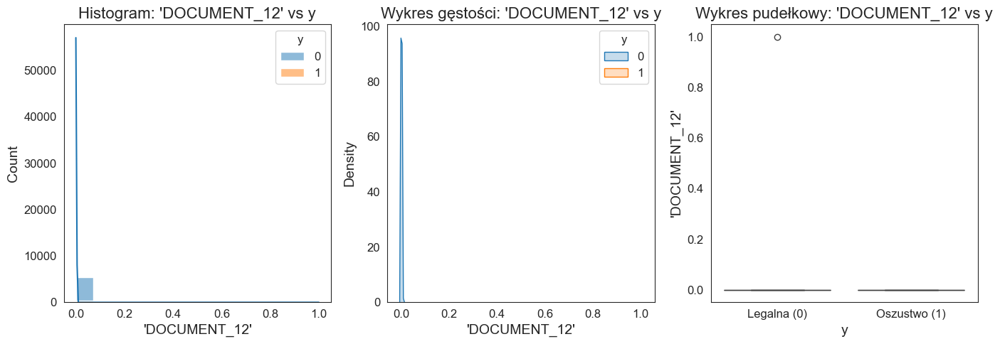

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_13'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.015122  0.122049  0.0  0.0  0.0  0.0  1.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


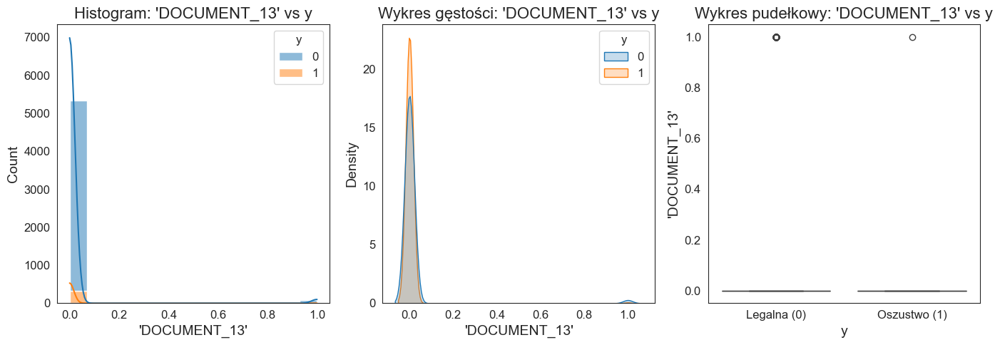

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_14'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.003535  0.059356  0.0  0.0  0.0  0.0  1.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


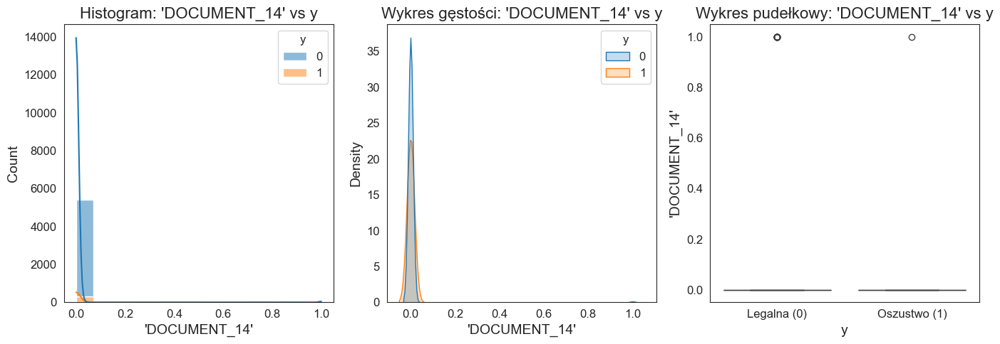

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_15'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.003928  0.062555  0.0  0.0  0.0  0.0  1.0
1   326.0  0.006135  0.078205  0.0  0.0  0.0  0.0  1.0


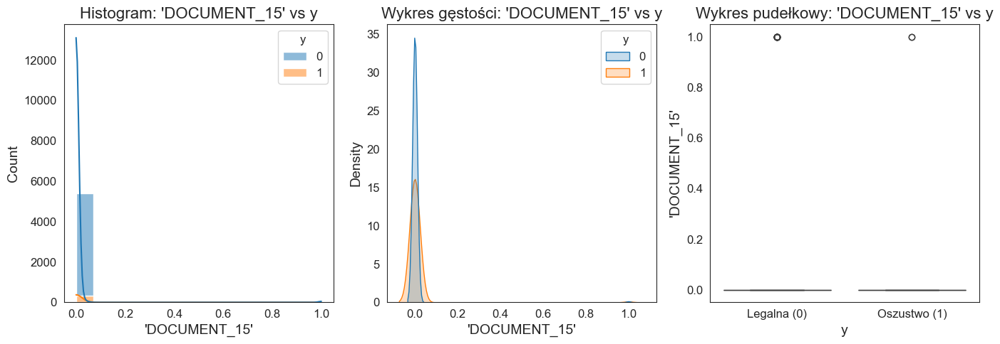

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_16'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.013747  0.116451  0.0  0.0  0.0  0.0  1.0
1   326.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


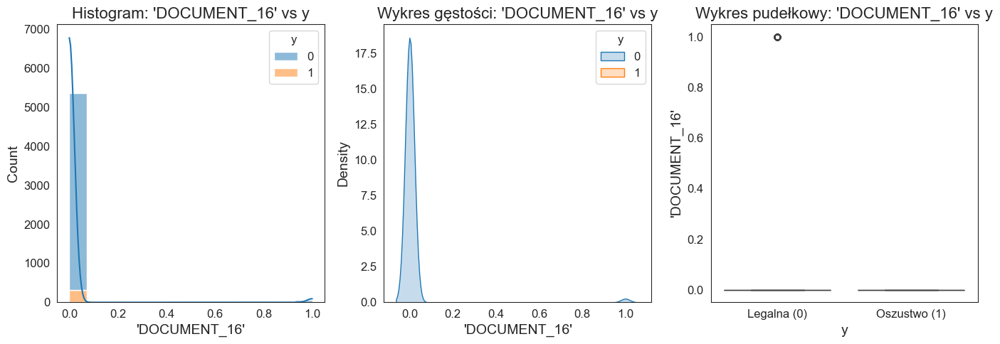

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_17'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.000196  0.014014  0.0  0.0  0.0  0.0  1.0
1   326.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


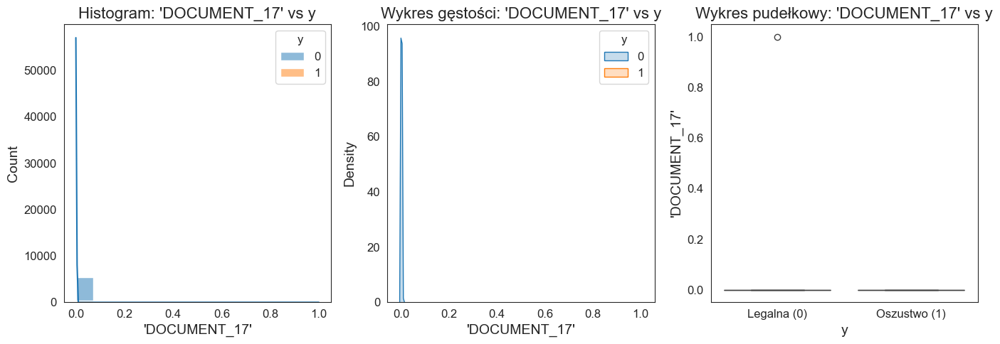

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_18'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.008445  0.091515  0.0  0.0  0.0  0.0  1.0
1   326.0  0.006135  0.078205  0.0  0.0  0.0  0.0  1.0


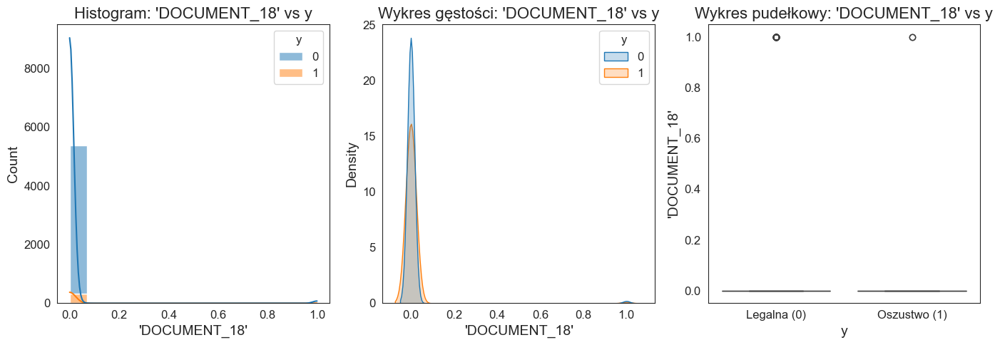

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_19'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.000393  0.019817  0.0  0.0  0.0  0.0  1.0
1   326.0  0.003067  0.055385  0.0  0.0  0.0  0.0  1.0


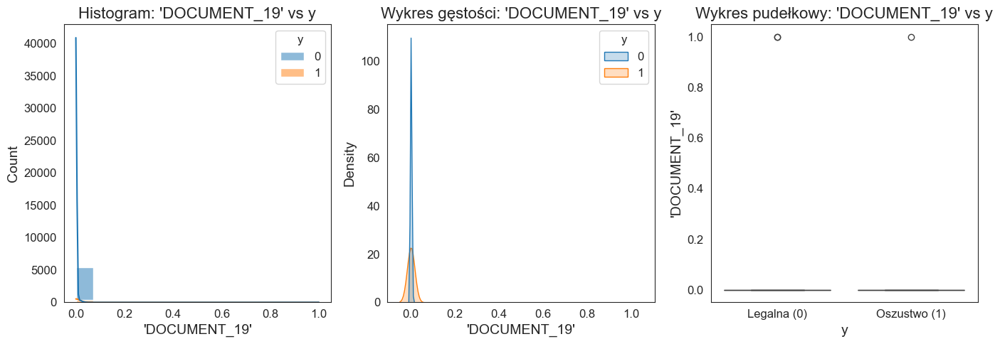

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_20'
Statystyki opisowe:
    count      mean      std  min  25%  50%  75%  max
y                                                    
0  5092.0  0.001571  0.03961  0.0  0.0  0.0  0.0  1.0
1   326.0  0.000000  0.00000  0.0  0.0  0.0  0.0  0.0


C:\Users\seksc\AppData\Local\Temp\ipykernel_24324\976954006.py:27: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)


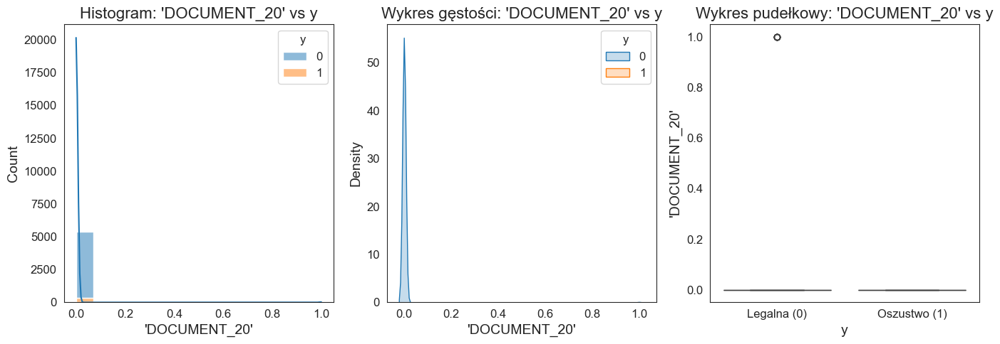

--------------------------------------------------

Cecha numeryczna: 'DOCUMENT_21'
Statystyki opisowe:
    count  mean  std  min  25%  50%  75%  max
y                                            
0  5092.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
1   326.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0

Cecha numeryczna: 'hours_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.005499  0.076567  0.0  0.0  0.0  0.0  2.0
1   326.0  0.009202  0.095634  0.0  0.0  0.0  0.0  1.0


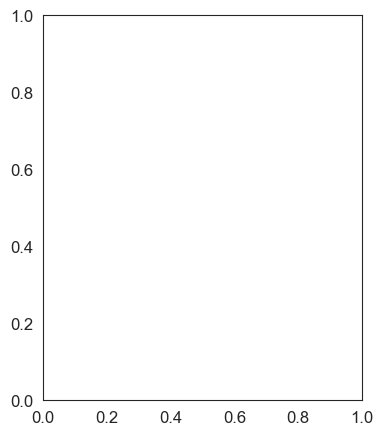

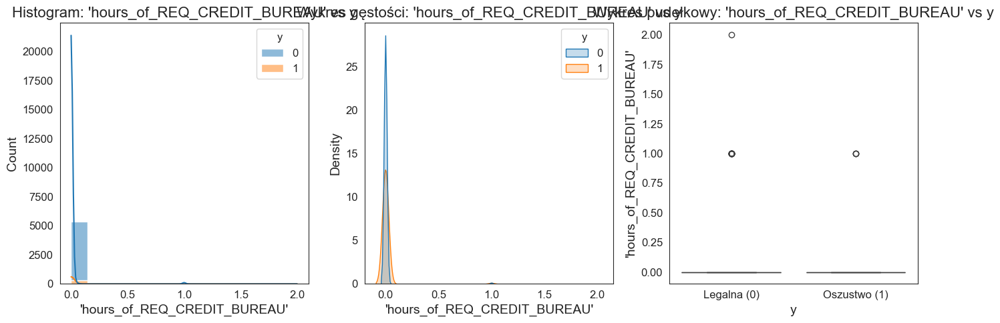

--------------------------------------------------

Cecha numeryczna: 'days_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.005695  0.087339  0.0  0.0  0.0  0.0  3.0
1   326.0  0.015337  0.123080  0.0  0.0  0.0  0.0  1.0


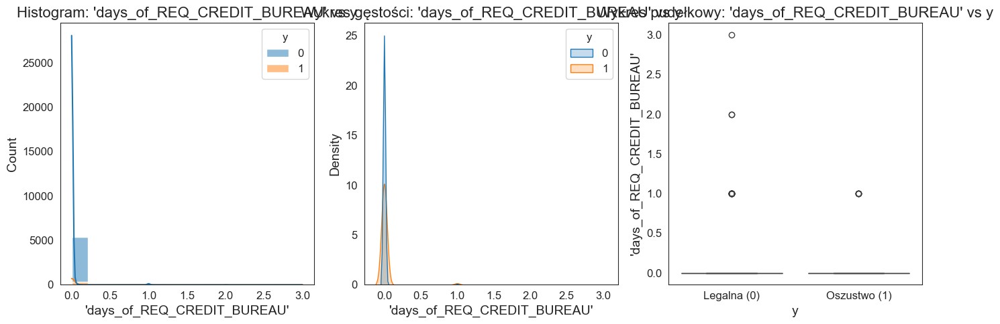

--------------------------------------------------

Cecha numeryczna: 'weeks_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.037510  0.194117  0.0  0.0  0.0  0.0  3.0
1   326.0  0.033742  0.180843  0.0  0.0  0.0  0.0  1.0


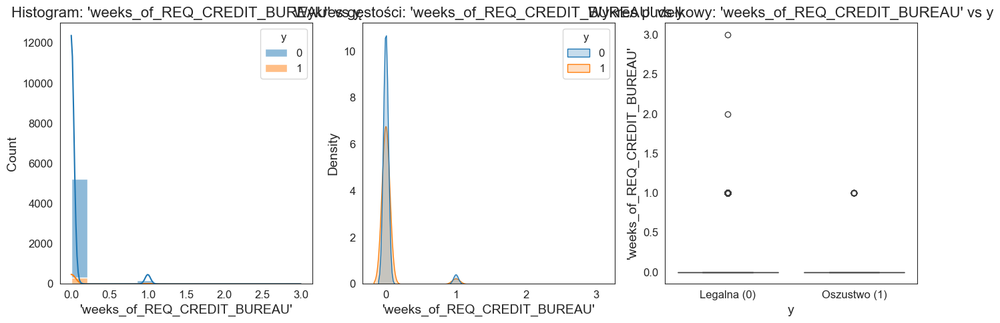

--------------------------------------------------

Cecha numeryczna: 'months_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%   max
y                                                      
0  5092.0  0.355263  1.023427  0.0  0.0  0.0  0.0  16.0
1   326.0  0.371166  1.098375  0.0  0.0  0.0  0.0  10.0


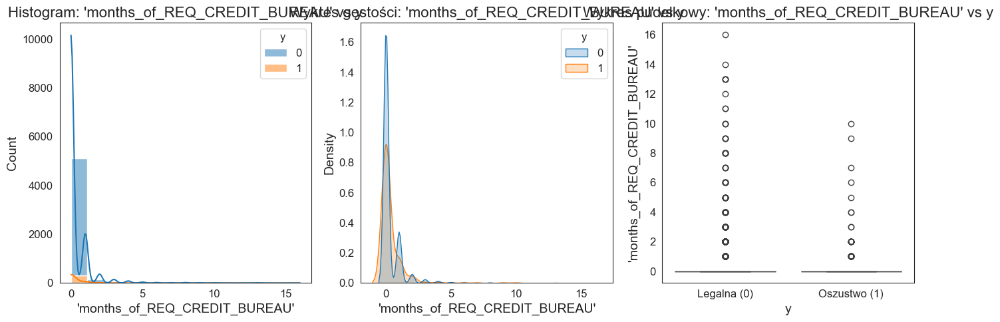

--------------------------------------------------

Cecha numeryczna: 'quarters_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%  max
y                                                     
0  5092.0  0.260408  0.580353  0.0  0.0  0.0  0.0  5.0
1   326.0  0.297546  0.706319  0.0  0.0  0.0  0.0  6.0


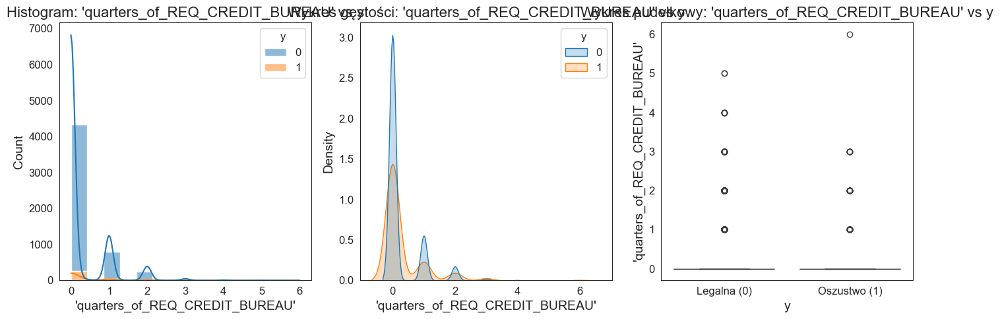

--------------------------------------------------

Cecha numeryczna: 'years_of_REQ_CREDIT_BUREAU'
Statystyki opisowe:
    count      mean       std  min  25%  50%  75%   max
y                                                      
0  5092.0  1.753142  1.753001  0.0  0.0  1.0  3.0  17.0
1   326.0  1.889571  1.894140  0.0  1.0  2.0  3.0  16.0


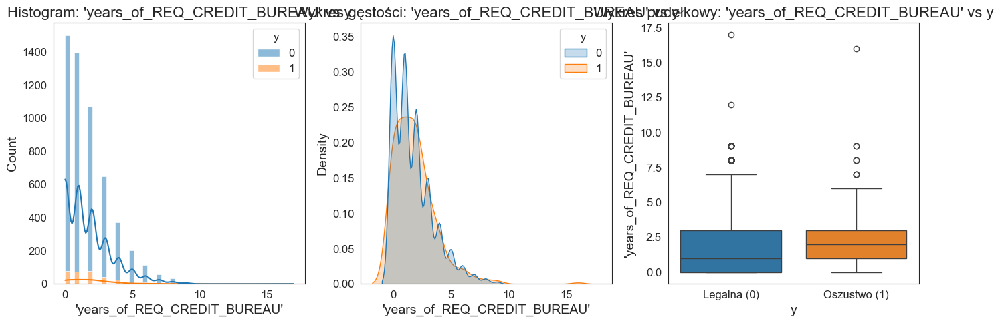

--------------------------------------------------

Analiza cech kategorycznych:

Cecha kategoryczna: 'contract_type'
Tabele liczebności (globalnie):
'contract_type'
0    4829
1     589
Name: count, dtype: int64

Tabele liczebności dla ''contract_type'' vs 'y':
y                   0    1
'contract_type'           
0                4524  305
1                 568   21


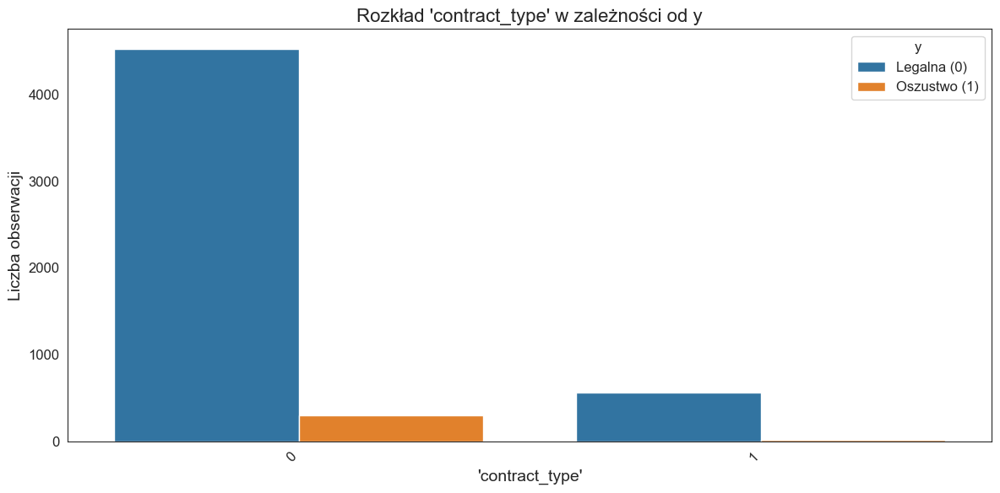

--------------------------------------------------

Cecha kategoryczna: 'gender'
Tabele liczebności (globalnie):
'gender'
1    2756
0    2662
Name: count, dtype: int64

Tabele liczebności dla ''gender'' vs 'y':
y            0    1
'gender'           
0         2528  134
1         2564  192


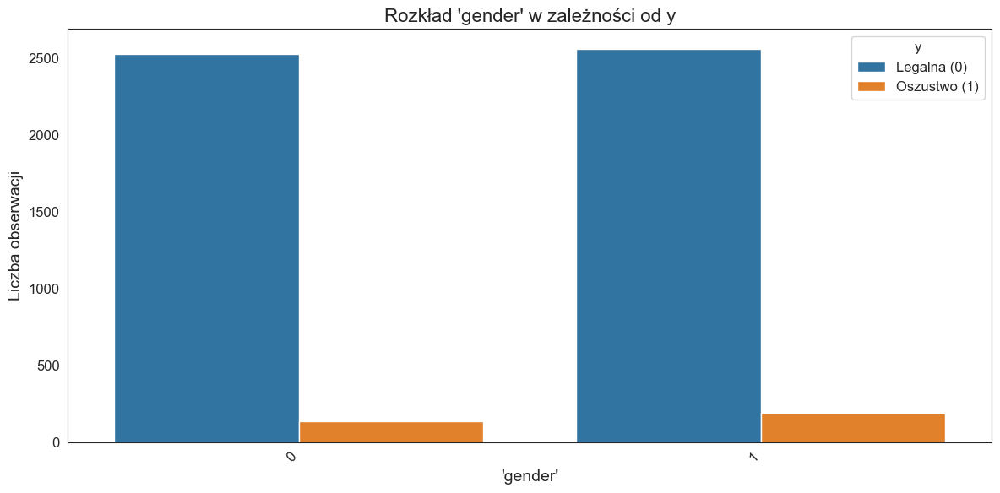

--------------------------------------------------

Cecha kategoryczna: 'own_car'
Tabele liczebności (globalnie):
'own_car'
0    5418
Name: count, dtype: int64

Tabele liczebności dla ''own_car'' vs 'y':
y             0    1
'own_car'           
0          5092  326


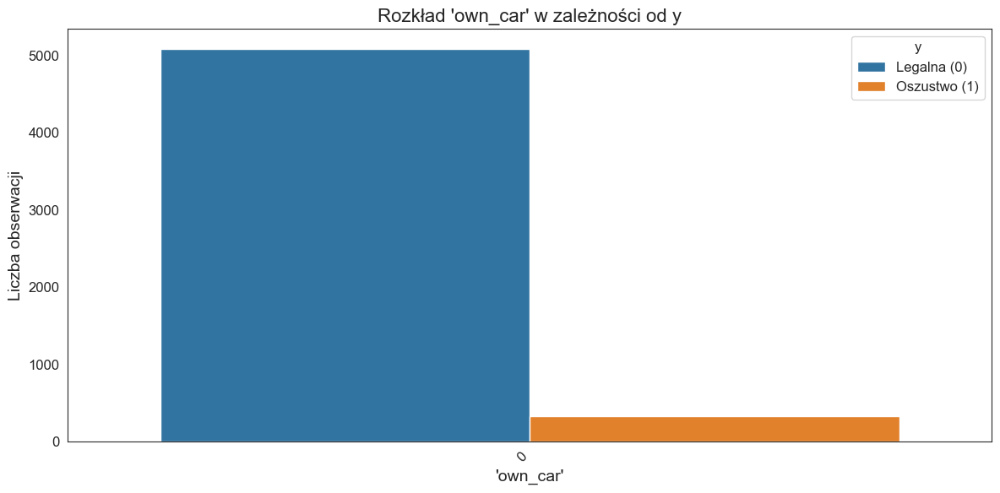

--------------------------------------------------

Cecha kategoryczna: 'own_reality'
Tabele liczebności (globalnie):
'own_reality'
1    3743
0    1675
Name: count, dtype: int64

Tabele liczebności dla ''own_reality'' vs 'y':
y                 0    1
'own_reality'           
0              1577   98
1              3515  228


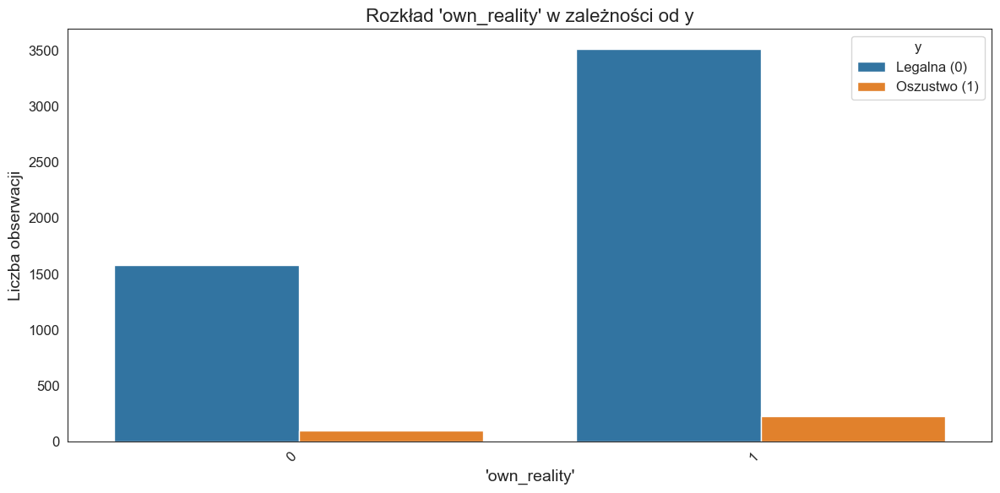

--------------------------------------------------

Cecha kategoryczna: 'suite_type'
Tabele liczebności (globalnie):
'suite_type'
6    4496
1     638
5     214
0      34
4      20
3      10
2       6
Name: count, dtype: int64

Tabele liczebności dla ''suite_type'' vs 'y':
y                0    1
'suite_type'           
0               32    2
1              605   33
2                5    1
3                9    1
4               18    2
5              199   15
6             4224  272


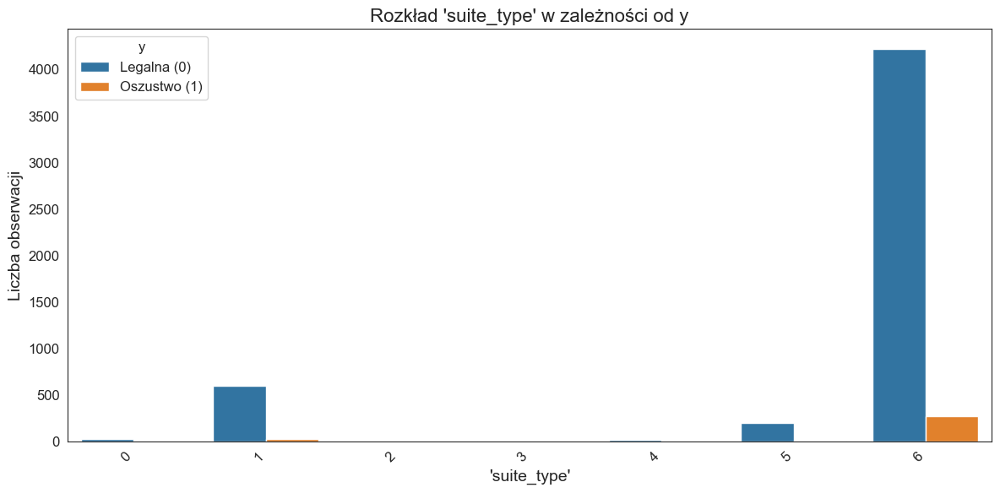

--------------------------------------------------

Cecha kategoryczna: 'income_type'
Tabele liczebności (globalnie):
'income_type'
2    3180
0    1779
1     459
Name: count, dtype: int64

Tabele liczebności dla ''income_type'' vs 'y':
y                 0    1
'income_type'           
0              1686   93
1               437   22
2              2969  211


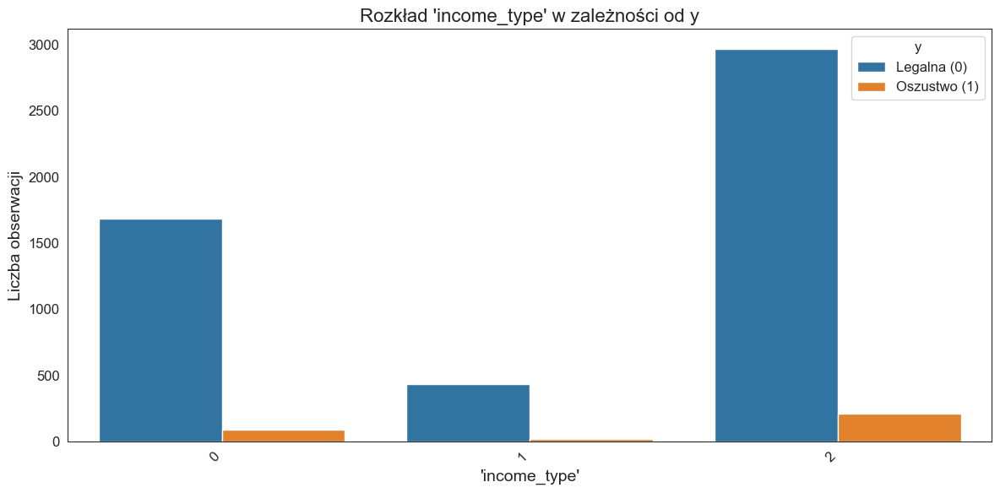

--------------------------------------------------

Cecha kategoryczna: 'education'
Tabele liczebności (globalnie):
'education'
4    2925
1    2210
2     256
3      22
0       5
Name: count, dtype: int64

Tabele liczebności dla ''education'' vs 'y':
y               0    1
'education'           
0               5    0
1            2116   94
2             241   15
3              19    3
4            2711  214


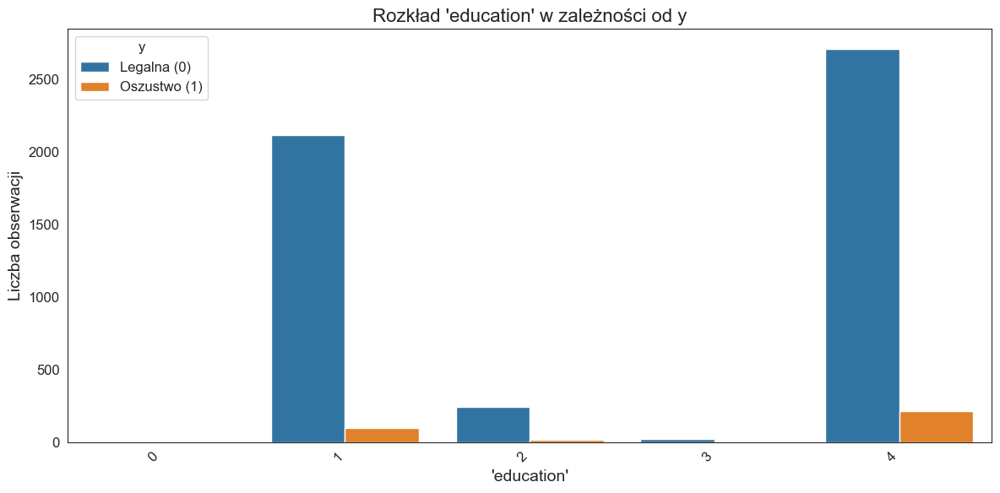

--------------------------------------------------

Cecha kategoryczna: 'marriage'
Tabele liczebności (globalnie):
'marriage'
1    3874
3     724
0     457
2     301
4      62
Name: count, dtype: int64

Tabele liczebności dla ''marriage'' vs 'y':
y              0    1
'marriage'           
0            411   46
1           3664  210
2            283   18
3            675   49
4             59    3


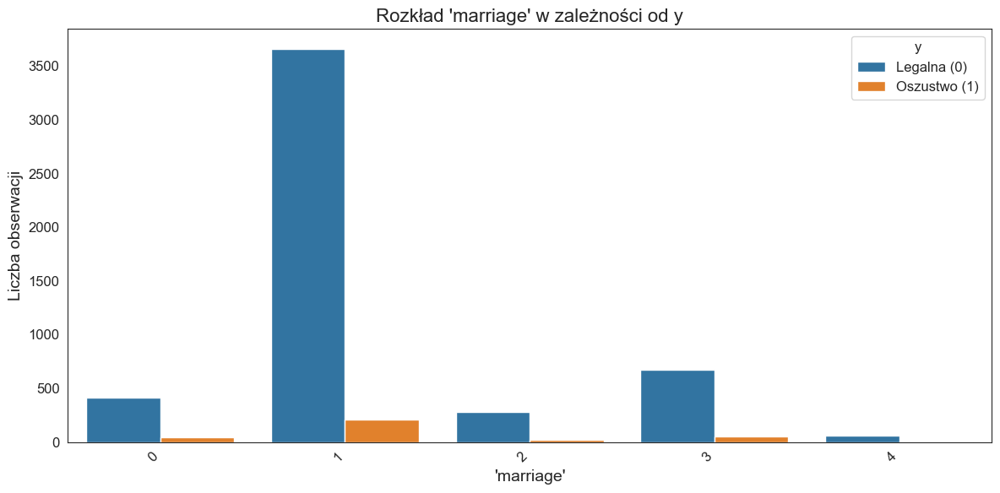

--------------------------------------------------

Cecha kategoryczna: 'housing_type'
Tabele liczebności (globalnie):
'housing_type'
1    4824
5     285
2     162
4      63
3      58
0      26
Name: count, dtype: int64

Tabele liczebności dla ''housing_type'' vs 'y':
y                  0    1
'housing_type'           
0                 25    1
1               4544  280
2                148   14
3                 55    3
4                 61    2
5                259   26


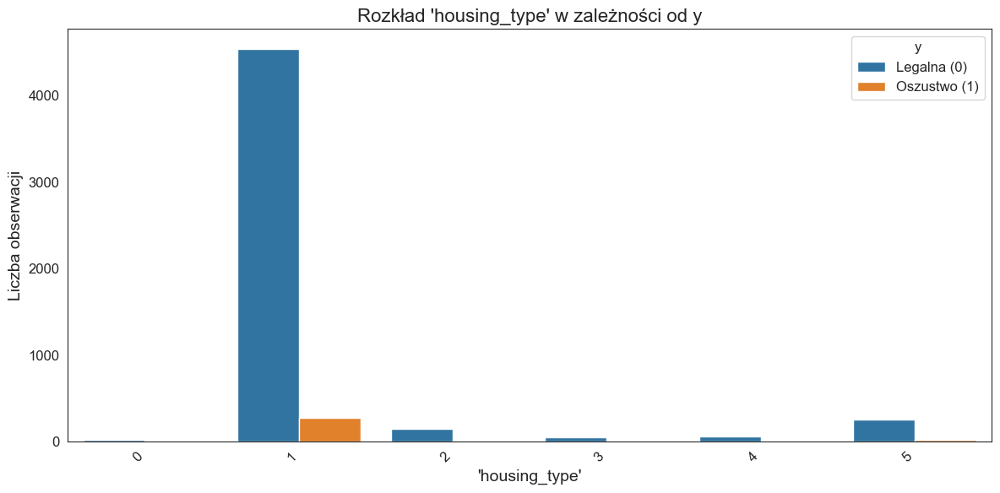

--------------------------------------------------

Cecha kategoryczna: 'occupation'
Tabele liczebności (globalnie):
'occupation'
8     1198
10     972
3      746
14     600
4      598
6      405
0      351
11     141
16     100
2       66
12      65
7       32
13      31
1       26
15      25
17      23
5       20
9       19
Name: count, dtype: int64

Tabele liczebności dla ''occupation'' vs 'y':
y                0   1
'occupation'          
0              342   9
1               24   2
10             921  51
11             136   5
12              62   3
13              29   2
14             558  42
15              24   1
16              90  10
17              20   3
2               62   4
3              714  32
4              549  49
5               19   1
6              385  20
7               29   3
8             1111  87
9               17   2


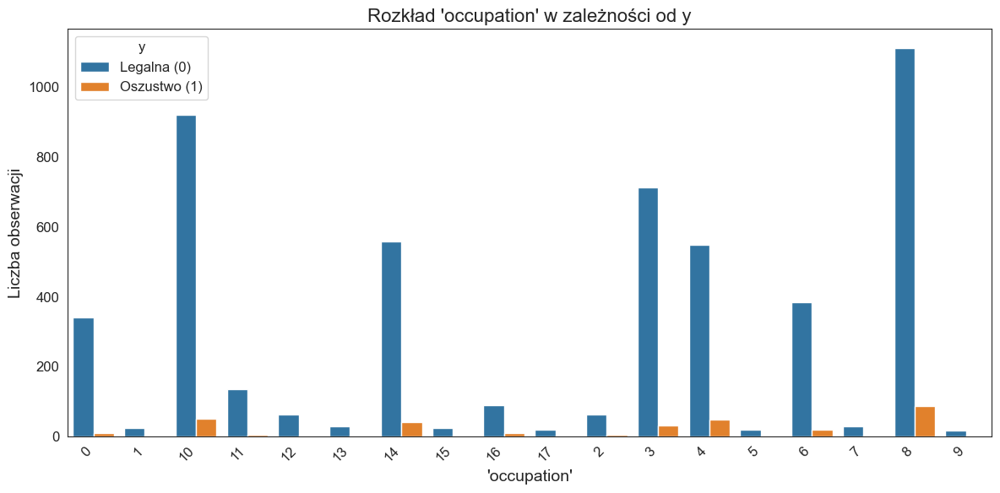

--------------------------------------------------

Cecha kategoryczna: 'weekday_APPR_process_start'
Tabele liczebności (globalnie):
'weekday_APPR_process_start'
1    956
6    939
5    903
0    875
4    875
2    588
3    282
Name: count, dtype: int64

Tabele liczebności dla ''weekday_APPR_process_start'' vs 'y':
y                               0   1
'weekday_APPR_process_start'         
0                             818  57
1                             894  62
2                             554  34
3                             265  17
4                             829  46
5                             848  55
6                             884  55


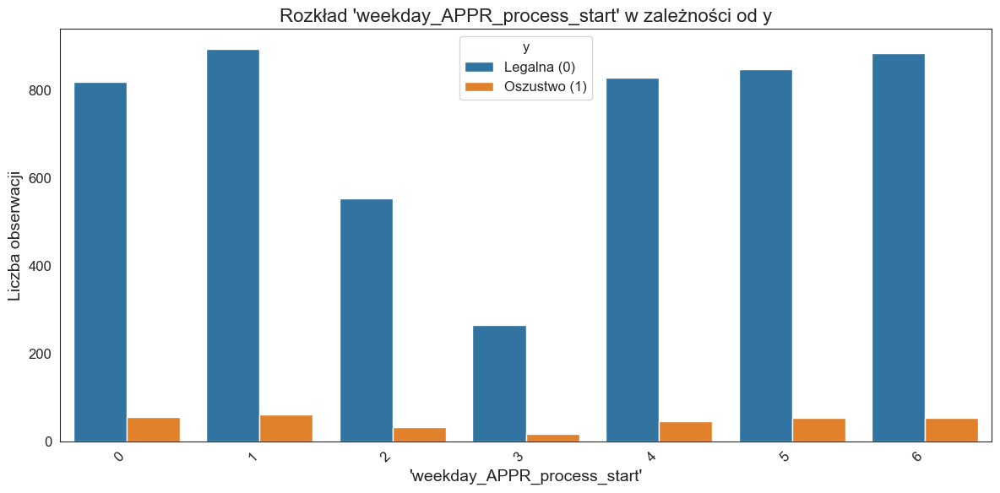

--------------------------------------------------

Cecha kategoryczna: 'organization_type'
Tabele liczebności (globalnie):
'organization_type'
5     1642
41     705
32     257
4      230
11     221
29     191
7      186
38     144
49     143
53     137
25     132
3      120
27     106
30      91
2       84
46      83
51      74
39      67
33      66
16      57
45      53
13      52
19      48
40      43
42      39
52      35
23      32
54      31
9       28
37      26
14      24
43      23
21      23
35      22
10      22
20      19
0       18
31      18
26      18
34      16
1       16
28      15
18      13
44      11
48       9
17       6
12       6
50       5
15       3
6        3
8        2
36       2
22       1
Name: count, dtype: int64

Tabele liczebności dla ''organization_type'' vs 'y':
y                       0    1
'organization_type'           
0                      17    1
1                      15    1
10                     22    0
11                    208   13
12     

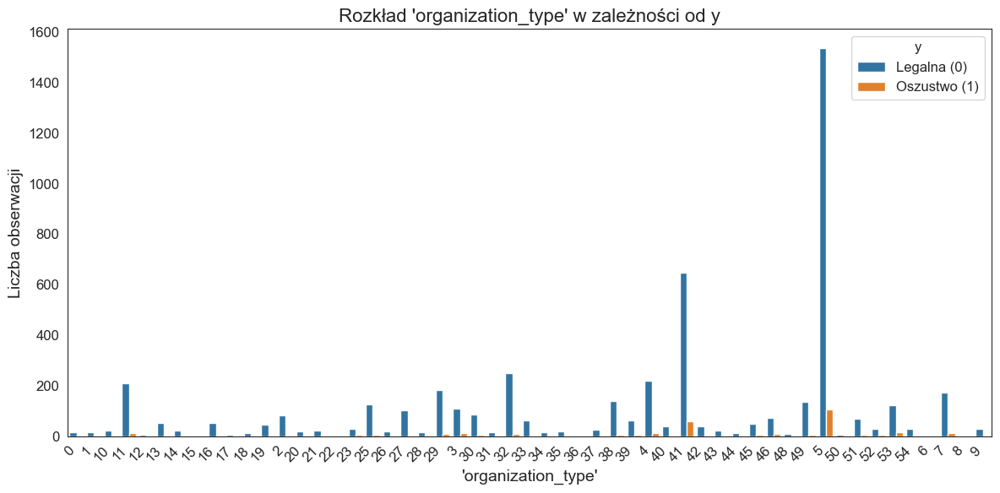

--------------------------------------------------

Cecha kategoryczna: 'FONDKAPREMONT_mode'
Tabele liczebności (globalnie):
'FONDKAPREMONT_mode'
2    4114
3     670
0     365
1     269
Name: count, dtype: int64

Tabele liczebności dla ''FONDKAPREMONT_mode'' vs 'y':
y                        0    1
'FONDKAPREMONT_mode'           
0                      344   21
1                      258   11
2                     3853  261
3                      637   33


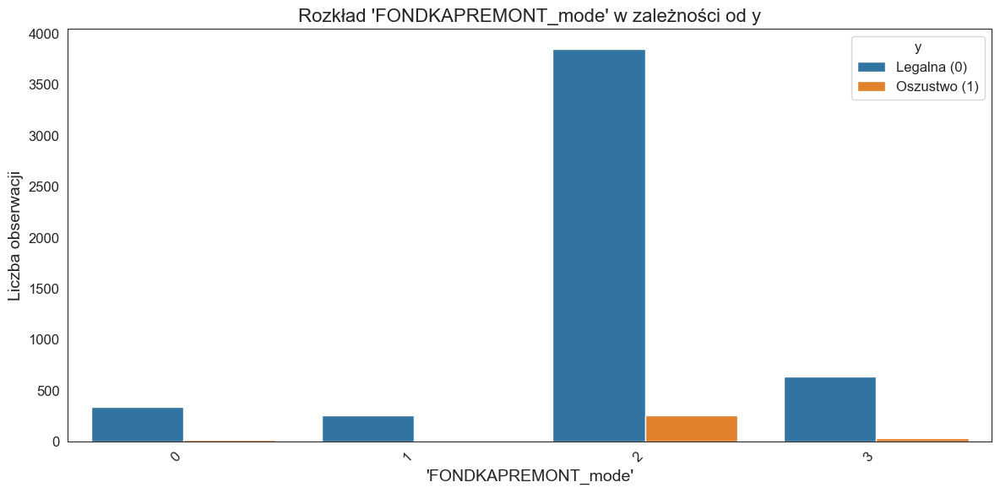

--------------------------------------------------

Cecha kategoryczna: 'house_type_mode'
Tabele liczebności (globalnie):
'house_type_mode'
0    5358
1      31
2      29
Name: count, dtype: int64

Tabele liczebności dla ''house_type_mode'' vs 'y':
y                     0    1
'house_type_mode'           
0                  5035  323
1                    29    2
2                    28    1


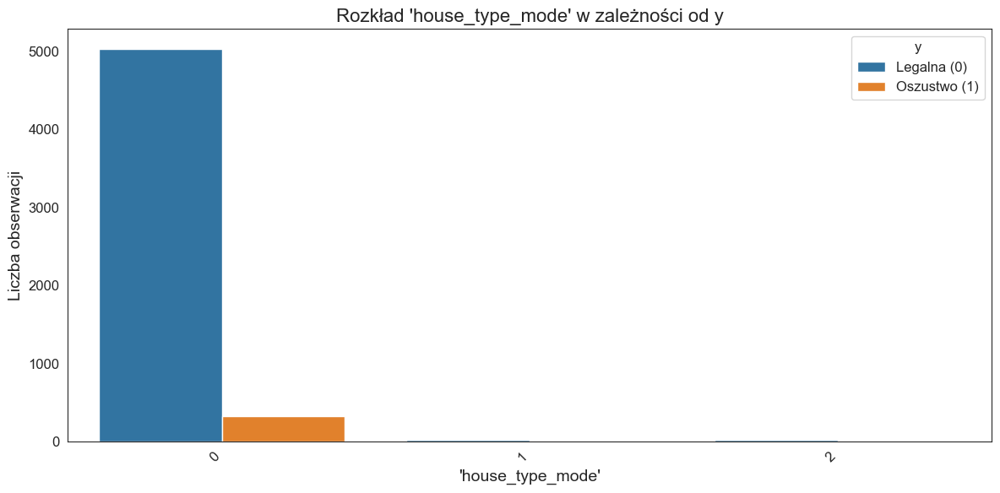

--------------------------------------------------

Cecha kategoryczna: 'walls_material_mode'
Tabele liczebności (globalnie):
'walls_material_mode'
4    2595
5    2150
0     348
6     100
2      93
3      68
1      64
Name: count, dtype: int64

Tabele liczebności dla ''walls_material_mode'' vs 'y':
y                         0    1
'walls_material_mode'           
0                       331   17
1                        64    0
2                        92    1
3                        65    3
4                      2444  151
5                      2005  145
6                        91    9


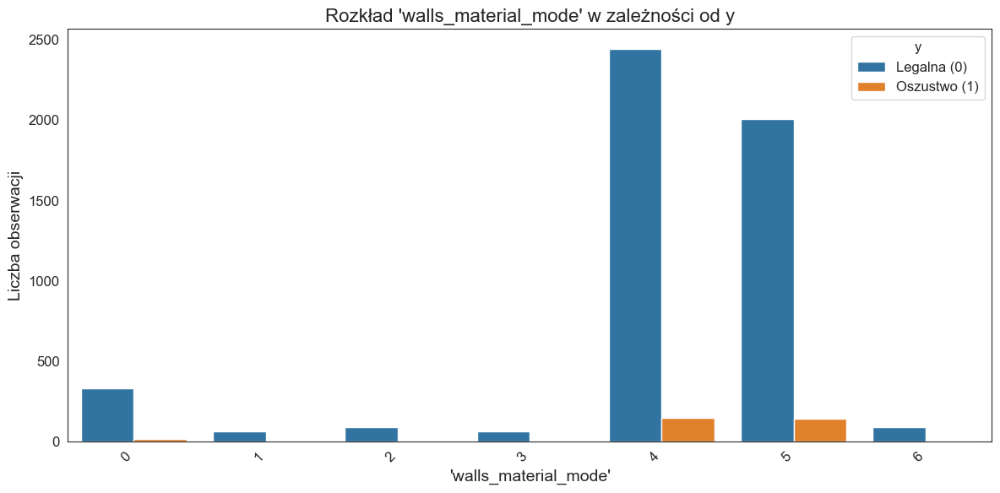

--------------------------------------------------

Cecha kategoryczna: 'emergency_state_mode'
Tabele liczebności (globalnie):
'emergency_state_mode'
0    5368
1      50
Name: count, dtype: int64

Tabele liczebności dla ''emergency_state_mode'' vs 'y':
y                          0    1
'emergency_state_mode'           
0                       5047  321
1                         45    5


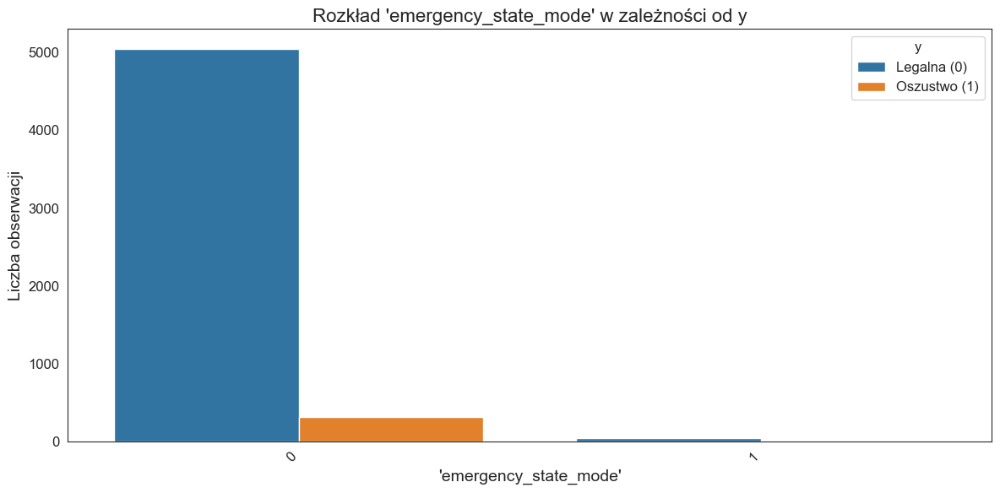

--------------------------------------------------


In [51]:
# 4. Analiza Poszczególnych Cech (Univariate Analysis) w Kontekście Zmiennej Celu
print(f"\n--- 4. Analiza Poszczególnych Cech w Kontekście Zmiennej Celu ('{TARGET_COLUMN}') ---")

if TARGET_COLUMN in df.columns:
    # Dla cech numerycznych
    print("\nAnaliza cech numerycznych:")
    for col in numerical_features:
        if col in df.columns and col != TARGET_COLUMN:
            print(f"\nCecha numeryczna: {col}")

            # Statystyki opisowe globalnie i dla każdej klasy
            print("Statystyki opisowe:")
            desc_stats = df.groupby(TARGET_COLUMN)[col].describe()
            print(desc_stats)
            
            # Wizualizacje
            plt.figure(figsize=(14, 5))
            try:
                # Histogramy
                plt.subplot(1, 3, 1)
                sns.histplot(data=df, x=col, hue=TARGET_COLUMN, kde=True, multiple="stack")
                plt.title(f'Histogram: {col} vs {TARGET_COLUMN}')
    
                # Wykresy gęstości
                plt.subplot(1, 3, 2)
                sns.kdeplot(data=df, x=col, hue=TARGET_COLUMN, fill=True, common_norm=False)
                plt.title(f'Wykres gęstości: {col} vs {TARGET_COLUMN}')
    
                # Box-ploty
                plt.subplot(1, 3, 3)
                sns.boxplot(data=df, x=TARGET_COLUMN, y=col, hue=TARGET_COLUMN, legend=False)
                plt.title(f'Wykres pudełkowy: {col} vs {TARGET_COLUMN}')
                plt.xticks([0, 1], ['Legalna (0)', 'Oszustwo (1)'])
            except Exception:
                continue
            plt.tight_layout()
            plt.show()
            print("-" * 50)

    # Dla cech kategorycznych
    print("\nAnaliza cech kategorycznych:")
    for col in categorical_features:
        if col in df.columns and col != TARGET_COLUMN:
            print(f"\nCecha kategoryczna: {col}")

            # Tabele liczebności
            print("Tabele liczebności (globalnie):")
            print(df[col].value_counts())
            print(f"\nTabele liczebności dla '{col}' vs '{TARGET_COLUMN}':")
            contingency_table = pd.crosstab(df[col], df[TARGET_COLUMN])
            print(contingency_table)

            # Wizualizacje (wykresy słupkowe)
            plt.figure(figsize=(12, 6))
            sns.countplot(data=df, x=col, hue=TARGET_COLUMN, dodge=True)
            plt.title(f'Rozkład {col} w zależności od {TARGET_COLUMN}')
            plt.ylabel('Liczba obserwacji')
            plt.xticks(rotation=45, ha='right')
            plt.legend(title=TARGET_COLUMN, labels=['Legalna (0)', 'Oszustwo (1)'])
            plt.tight_layout()
            plt.show()
            print("-" * 50)
else:
    print(
        f"Nie można przeprowadzić analizy cech w kontekście zmiennej celu, ponieważ zmienna '{TARGET_COLUMN}' nie istnieje.")


--- 5. Analiza Zależności Między Cechami ---

Macierz korelacji dla cech numerycznych:


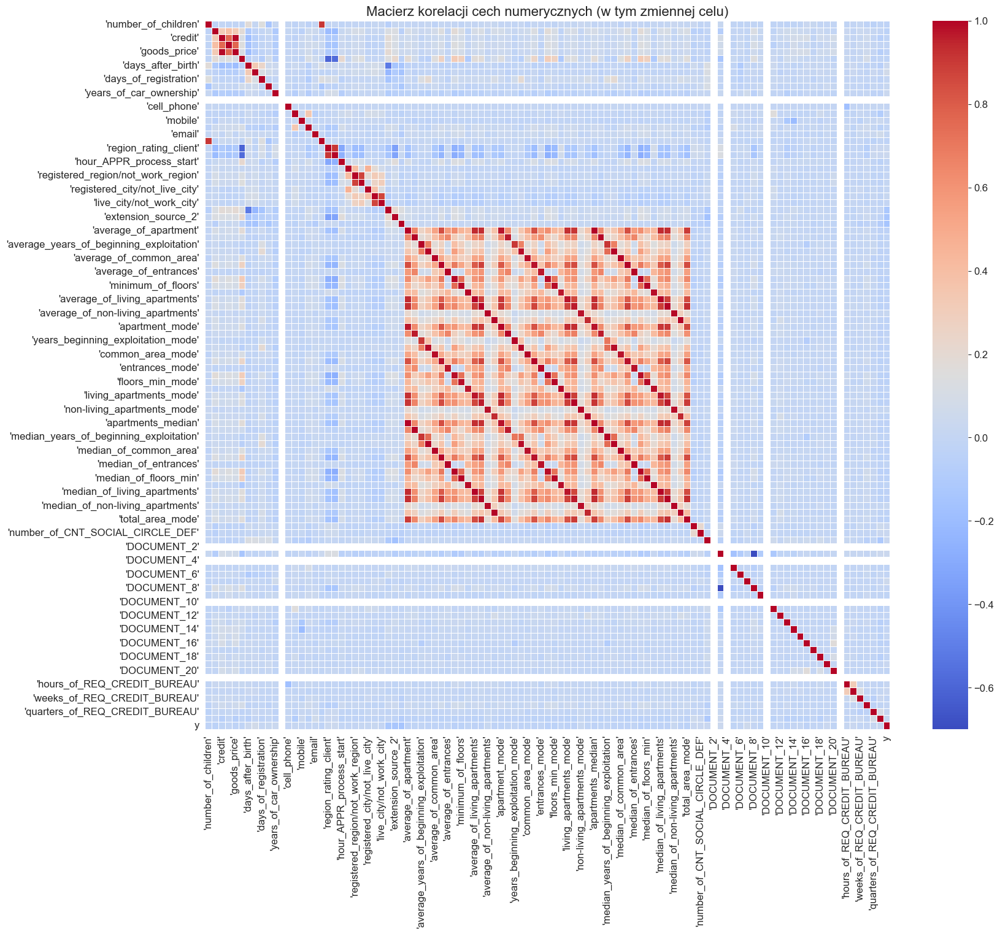


Korelacje cech numerycznych ze zmienną celu:
y                                   1.000000
'days_of_employment'                0.075547
'DOCUMENT_7'                        0.053698
'region_rating_client_with_city'    0.042096
'DOCUMENT_3'                        0.040170
                                      ...   
'mobile_phone'                           NaN
'DOCUMENT_2'                             NaN
'DOCUMENT_4'                             NaN
'DOCUMENT_10'                            NaN
'DOCUMENT_21'                            NaN
Name: y, Length: 103, dtype: float64


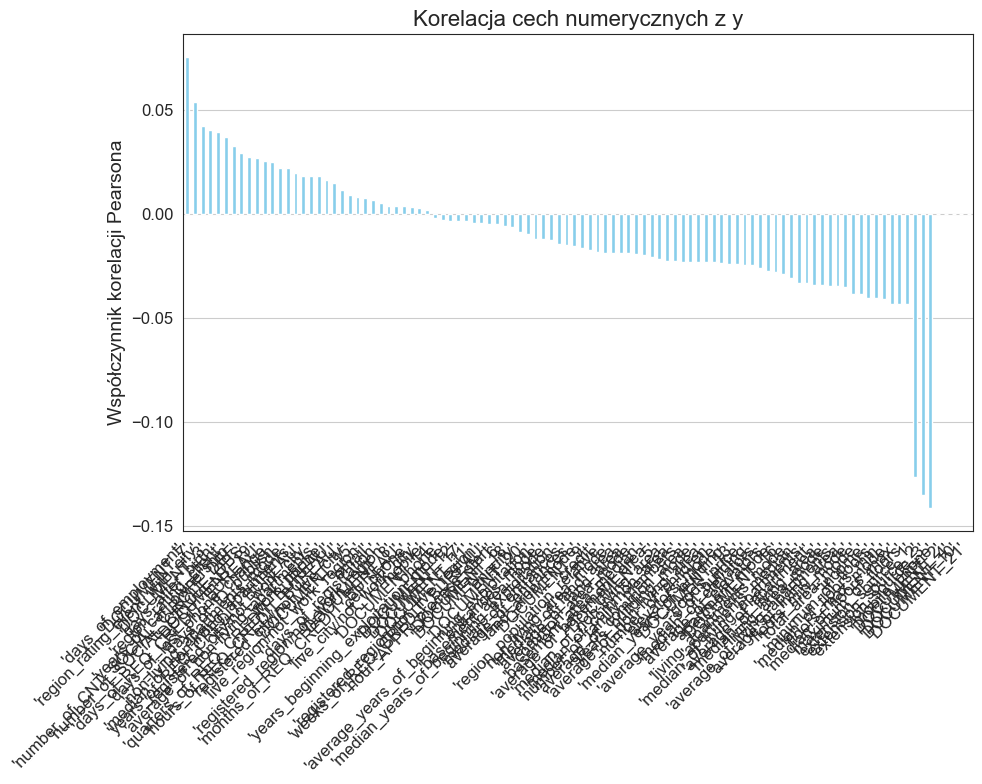


Przykładowe wykresy rozrzutu dla par cech numerycznych (kolorowane wg zmiennej celu):
Wybrane cechy do scatter plot: 'extension_source_3' vs 'extension_source_2'


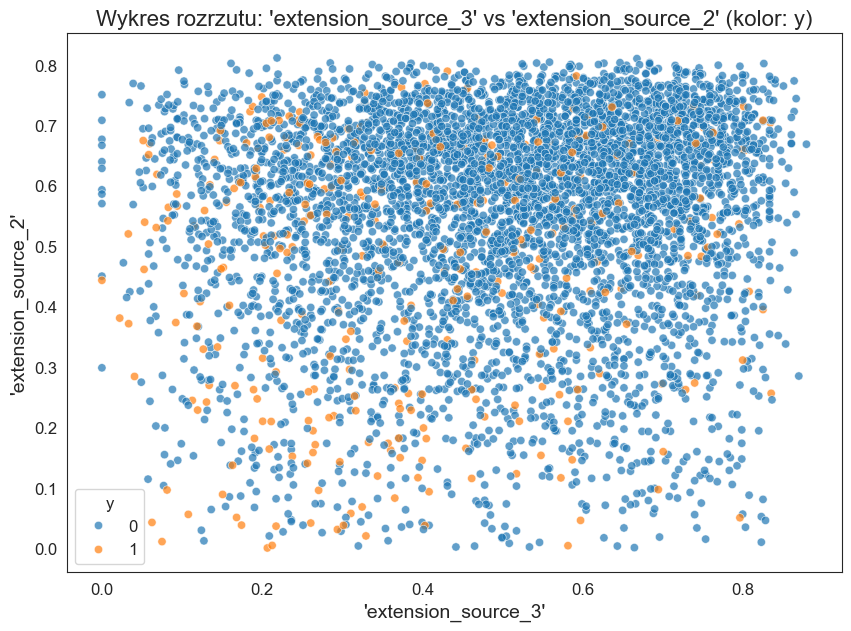

In [52]:
# 5. Analiza Zależności Między Cechami (Bivariate/Multivariate Analysis)
print("\n--- 5. Analiza Zależności Między Cechami ---")

if TARGET_COLUMN in df.columns:
    # Korelacje dla cech numerycznych
    print("\nMacierz korelacji dla cech numerycznych:")
    numerical_df_for_corr = df[numerical_features + [TARGET_COLUMN]] if TARGET_COLUMN in numerical_features else df[
        numerical_features].copy()
    if TARGET_COLUMN not in numerical_df_for_corr and TARGET_COLUMN in df.columns:  # Upewnijmy się, że target jest w df do korelacji
        numerical_df_for_corr[TARGET_COLUMN] = df[TARGET_COLUMN]

    correlation_matrix = numerical_df_for_corr.corr()
    plt.figure(figsize=(18, 15))  # Zwiększony rozmiar dla lepszej czytelności
    sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f",
                linewidths=.5)  # annot=False, bo może być za dużo liczb
    plt.title('Macierz korelacji cech numerycznych (w tym zmiennej celu)')
    plt.show()

    print("\nKorelacje cech numerycznych ze zmienną celu:")
    if TARGET_COLUMN in correlation_matrix.columns:
        target_correlations = correlation_matrix[TARGET_COLUMN].sort_values(ascending=False)
        print(target_correlations)
        # Wizualizacja korelacji z celem
        plt.figure(figsize=(10, 8))
        target_correlations.drop(TARGET_COLUMN).plot(kind='bar', color='skyblue')  # Usunięcie korelacji samej ze sobą
        plt.title(f'Korelacja cech numerycznych z {TARGET_COLUMN}')
        plt.ylabel('Współczynnik korelacji Pearsona')
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Zmienna celu '{TARGET_COLUMN}' nie została uwzględniona w macierzy korelacji cech numerycznych.")

    # Wykresy rozrzutu dla wybranych par cech numerycznych
    print("\nPrzykładowe wykresy rozrzutu dla par cech numerycznych (kolorowane wg zmiennej celu):")
    if len(numerical_features) >= 2:
        # Wybierzmy kilka cech, które wykazały jakąś korelację z celem lub są interesujące
        # Na przykład, weźmy pierwsze 2-3 cechy z listy `numerical_features` lub te z najwyższą korelacją
        if 'target_correlations' in locals() and not target_correlations.empty:
            # Weźmy cechy o najwyższej (co do wartości bezwzględnej) korelacji, pomijając samą zmienną celu
            strongest_predictors = target_correlations.drop(TARGET_COLUMN).abs().nlargest(3).index.tolist()
            if len(strongest_predictors) < 2 and len(
                    numerical_features) >= 2:  # Jeśli nie ma silnych, weźmy pierwsze dwie
                strongest_predictors = numerical_features[:2]
            elif len(strongest_predictors) == 0 and len(numerical_features) >= 1:
                strongest_predictors = numerical_features[:1]  # W razie czego tylko jedna cecha
        elif len(numerical_features) >= 2:
            strongest_predictors = numerical_features[:2]
        elif len(numerical_features) == 1:
            strongest_predictors = numerical_features[:1]
        else:
            strongest_predictors = []

        if len(strongest_predictors) >= 2:
            print(f"Wybrane cechy do scatter plot: {strongest_predictors[0]} vs {strongest_predictors[1]}")
            plt.figure(figsize=(10, 7))
            sns.scatterplot(data=df, x=strongest_predictors[0], y=strongest_predictors[1], hue=TARGET_COLUMN,
                            alpha=0.7)
            plt.title(
                f'Wykres rozrzutu: {strongest_predictors[0]} vs {strongest_predictors[1]} (kolor: {TARGET_COLUMN})')
            plt.show()
        elif len(strongest_predictors) == 1:
            print(
                f"Wybrano tylko jedną cechę numeryczną '{strongest_predictors[0]}' dla scatter plot, potrzebne są co najmniej dwie.")
        else:
            print("Brak wystarczającej liczby cech numerycznych do stworzenia wykresu rozrzutu.")
    else:
        print("Niewystarczająca liczba cech numerycznych do stworzenia wykresów rozrzutu.")
else:
    print(f"Nie można przeprowadzić analizy zależności, ponieważ zmienna celu '{TARGET_COLUMN}' nie istnieje.")

In [53]:
# 6. Ocena Jakości Danych
print("\n--- 6. Ocena Jakości Danych ---")

# Braki danych (Missing Values)
print("\nAnaliza braków danych:")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
missing_data_summary = pd.DataFrame({'Liczba braków': missing_values, 'Procent braków (%)': missing_percentage})
missing_data_summary = missing_data_summary[missing_data_summary['Liczba braków'] > 0].sort_values(
    by='Procent braków (%)', ascending=False)

if not missing_data_summary.empty:
    print("Cechy z brakującymi wartościami:")
    print(missing_data_summary)

    # Wizualizacja braków danych
    plt.figure(figsize=(12, 7))
    sns.heatmap(df.isnull(), cbar=False, cmap='viridis_r', yticklabels=False)
    plt.title('Mapa braków danych w zbiorze')
    plt.show()

    print("\nPotencjalne strategie radzenia sobie z brakami:")
    print("- Usunięcie wierszy/kolumn (jeśli procent braków jest bardzo mały/duży i nie wpływa to znacząco na dane).")
    print(
        "- Imputacja: zastąpienie braków wartościami (np. średnią, medianą dla cech numerycznych; modą dla kategorycznych; lub bardziej zaawansowane metody jak KNNImputer, MICE).")
    print("- Stworzenie wskaźnika braku danych (np. nowa cecha binarna wskazująca, czy wartość była brakująca).")
    print("Wybór strategii zależy od charakteru danych i skali problemu.")
else:
    print("Brak brakujących wartości w danych (poza celowym zastąpieniem -1 przez NaN).")


--- 6. Ocena Jakości Danych ---

Analiza braków danych:
Brak brakujących wartości w danych (poza celowym zastąpieniem -1 przez NaN).


In [54]:
# Kardynalność cech kategorycznych
print("\nKardynalność cech kategorycznych:")
high_cardinality_threshold = 20  # Próg dla wysokiej kardynalności (można dostosować)
for col in categorical_features:
    if col in df.columns:
        num_unique = df[col].nunique()
        print(f"- Cecha '{col}': {num_unique} unikalnych wartości.")
        if num_unique > high_cardinality_threshold:
            print(f"  UWAGA: Cecha '{col}' ma wysoką kardynalność ({num_unique}). Może to utrudnić modelowanie.")
            print(
                "  Rozważ: grupowanie kategorii, target encoding, usunięcie cechy lub użycie modeli dobrze radzących sobie z takimi cechami (np. drzewiaste).")




Kardynalność cech kategorycznych:
- Cecha ''contract_type'': 2 unikalnych wartości.
- Cecha ''gender'': 2 unikalnych wartości.
- Cecha ''own_car'': 1 unikalnych wartości.
- Cecha ''own_reality'': 2 unikalnych wartości.
- Cecha ''suite_type'': 7 unikalnych wartości.
- Cecha ''income_type'': 3 unikalnych wartości.
- Cecha ''education'': 5 unikalnych wartości.
- Cecha ''marriage'': 5 unikalnych wartości.
- Cecha ''housing_type'': 6 unikalnych wartości.
- Cecha ''occupation'': 18 unikalnych wartości.
- Cecha ''weekday_APPR_process_start'': 7 unikalnych wartości.
- Cecha ''organization_type'': 53 unikalnych wartości.
  UWAGA: Cecha ''organization_type'' ma wysoką kardynalność (53). Może to utrudnić modelowanie.
  Rozważ: grupowanie kategorii, target encoding, usunięcie cechy lub użycie modeli dobrze radzących sobie z takimi cechami (np. drzewiaste).
- Cecha ''FONDKAPREMONT_mode'': 4 unikalnych wartości.
- Cecha ''house_type_mode'': 3 unikalnych wartości.
- Cecha ''walls_material_mode'': 7 